In [1]:
import sys
import os

from threeML import *
import numpy as np
import h5py
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
%matplotlib inline

15:28:42 WARNING   The naima package is not available. Models that depend on it will not be         ]8;id=302147;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/functions.py\functions.py]8;;\:]8;id=389558;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/functions.py#48\48]8;;\
                  available                                                                                        

         WARNING   The GSL library or the pygsl wrapper cannot be loaded. Models that depend on it  ]8;id=404337;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/functions.py\functions.py]8;;\:]8;id=18827;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/functions.py#69\69]8;;\
                  will not be available.                                                                           

         WARNING   The ebltable package is not available. Models that depend on it will not be     ]8;id=691780;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/absorption.py\absorption.py]8;;\:]8;id=669625;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/functions/functions_1D/absorption.py#36\36]8;;\
                  available                                                                                        

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=665241;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=752050;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=885192;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=751287;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=720965;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=864117;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=418943;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=425063;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

15:28:43 WARNING   We have set the min_value of F to 1e-99 because there was a postive transform   ]8;id=881388;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=390862;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=934588;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=942260;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/astromodels/core/parameter.py#704\704]8;;\

## GRS1124 section

In [2]:
pa = '/home/yahecker/Obs_Data/GRS1124/'
data_path = pa + 'mag_%s.txt'%'g'
gdata = XYLike.from_text_file("gdata", data_path)
gdata.assign_to_source(source_name = 'Xrb_gband_source')

data_path = pa +'mag_%s.txt'%'r'
rdata = XYLike.from_text_file("rdata", data_path)
rdata.assign_to_source(source_name = 'Xrb_rband_source')

data_path = pa +'mag_%s.txt'%'i'
idata = XYLike.from_text_file("idata", data_path)
idata.assign_to_source(source_name = 'Xrb_iband_source')

data_path = pa +'mag_%s.txt'%'z'
zdata = XYLike.from_text_file("zdata", data_path)
zdata.assign_to_source(source_name = 'Xrb_zband_source')

data_path = pa +'mag_%s.txt'%'J'
Jdata = XYLike.from_text_file("Jdata", data_path)
Jdata.assign_to_source(source_name = 'Xrb_Jband_source')

# data_path = pa +'mag_%s.txt'%'H'
# Hdata = XYLike.from_text_file("Hdata", data_path)
# Hdata.assign_to_source(source_name = 'Xrb_Hband_source')

data_path = pa +'mag_%s.txt'%'K'
Kdata = XYLike.from_text_file("Kdata", data_path)
Kdata.assign_to_source(source_name = 'Xrb_Kband_source')

# data = DataList(gdata, rdata, idata, zdata, Jdata, Hdata, Kdata)
data = DataList(gdata, rdata, idata, zdata, Jdata, Kdata)



[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.
[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.
[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.
[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.
[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.
[INFO    ] Using Gaussian statistic (equivalent to chi^2) with the provided errors.


In [4]:
def ModeltoPointSource(band):
    mod = TemplateModel('GRS1124_AV_f_gnorm_%s'%band, log_interp = False)
    mod.K.fix = True
    mod.scale.fix =True
    
    return PointSource('Xrb_%s_source'%band, 0, 0, spectral_shape = mod)

filter_list = ['gband', 'rband', 'iband', 'zband', 'Jband', 'Kband']
point_source_list = ['ps_g', 'ps_r', 'ps_i', 'ps_z', 'ps_J', 'ps_K']
PointSdict = {}
for h in range(len(filter_list)):
    PointSdict[point_source_list[h]] = ModeltoPointSource(filter_list[h])

my_model = Model(PointSdict['ps_g'], PointSdict['ps_r'],
                 PointSdict['ps_i'], PointSdict['ps_z'],
                 PointSdict['ps_J'], PointSdict['ps_K'])


In [5]:
allInklParams =[my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.Inkl,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.Inkl,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.Inkl,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.Inkl,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.Inkl,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.Inkl]
allT_DiscParams =[my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.T_Disc,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.T_Disc,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.T_Disc,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.T_Disc,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.T_Disc,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.T_Disc]
allT_HSParams =[my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.T_HS,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.T_HS,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.T_HS,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.T_HS,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.T_HS,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.T_HS]
allT_SecParams = [my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.T_Sec,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.T_Sec,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.T_Sec,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.T_Sec,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.T_Sec,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.T_Sec]
allf_rParams = [my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.f_r,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.f_r,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.f_r,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.f_r,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.f_r,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.f_r]
allRinnerParams = [my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.R_inner,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.R_inner,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.R_inner,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.R_inner,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.R_inner,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.R_inner]
allAVParams = [my_model.Xrb_Kband_source.spectrum.main.GRS1124_AV_f_gnorm_Kband.A_V,
                 my_model.Xrb_rband_source.spectrum.main.GRS1124_AV_f_gnorm_rband.A_V,
                 my_model.Xrb_iband_source.spectrum.main.GRS1124_AV_f_gnorm_iband.A_V,
                 my_model.Xrb_Jband_source.spectrum.main.GRS1124_AV_f_gnorm_Jband.A_V,
                 # my_model.Xrb_Hband_source.spectrum.main.GRS1124_AV_f_gnorm_Hband.A_V,
                 my_model.Xrb_zband_source.spectrum.main.GRS1124_AV_f_gnorm_zband.A_V]

my_model.link(allInklParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.Inkl)
my_model.link(allT_DiscParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Disc)
my_model.link(allT_HSParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_HS)
my_model.link(allT_SecParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Sec)
my_model.link(allRinnerParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.R_inner)
my_model.link(allf_rParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.f_r)
my_model.link(allAVParams, my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.A_V)

In [6]:
my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.Inkl.prior = Truncated_gaussian(mu = 58, sigma = 15,
                                                                                     lower_bound = 50,
                                                                                     upper_bound=70)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Sec.prior = Truncated_gaussian(mu = 4700, sigma=200,
                                                                                      lower_bound = 4500,
                                                                                      upper_bound = 4900)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Disc.prior = Truncated_gaussian(mu = 3000, sigma=7000,
                                                                                      lower_bound = 2000,
                                                                                      upper_bound = 4000)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.f_r.prior = Truncated_gaussian(mu = 0.7, sigma = 0.6,
                                                                                      lower_bound = 0.0,
                                                                                      upper_bound = 1.0)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_HS.prior = Truncated_gaussian(mu = 7000, sigma=4000,
                                                                                       lower_bound = 4000,
                                                                                       upper_bound = 10000)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.R_inner.prior = Truncated_gaussian(mu = 7000, sigma=4000,
                                                                                        lower_bound = 1000,
                                                                                        upper_bound = 10000)

my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.A_V.prior = Truncated_gaussian(mu = 1.0, sigma=0.5,
                                                                                        lower_bound = 0.8,
                                                                                        upper_bound = 1.7)

<Figure size 2160x1080 with 0 Axes>

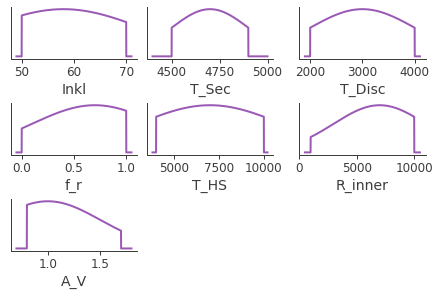

In [7]:
plt.figure(figsize=(30, 15))

fig, axes = plt.subplot_mosaic([['ul', 'uc', 'ur'],
                               ['cl', 'cc', 'cr'],
                               ['bl','x','x']],
                              constrained_layout=True
                              )

axes['ul'].plot(np.linspace(49, 71, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.Inkl.prior.evaluate(x=np.linspace(49,71,1000),
                                                                                                 F=1,
                                                                                                 mu=58,
                                                                                                 sigma=15,
                                                                                                 lower_bound=50,
                                                                                                 upper_bound=70
                                                                                                ))

axes['ul'].get_yaxis().set_visible(False)
axes['ul'].set_xlabel('Inkl')

axes['uc'].plot(np.linspace(4400, 5000, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Sec.prior.evaluate(x=np.linspace(4400,5000,1000),
                                                                                                  F=1,
                                                                                                  mu=4700,
                                                                                                  sigma=200,
                                                                                                  lower_bound=4500,
                                                                                                  upper_bound=4900
                                                                                                 ))

axes['uc'].get_yaxis().set_visible(False)
axes['uc'].set_xlabel('T_Sec')

axes['ur'].plot(np.linspace(1900, 4100, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_Disc.prior.evaluate(x=np.linspace(1900,4100,1000),
                                                                                                 F=1,
                                                                                                 mu=3000,
                                                                                                 sigma=1000,
                                                                                                 lower_bound=2000,
                                                                                                 upper_bound=4000
                                                                                                ))

axes['ur'].get_yaxis().set_visible(False)
axes['ur'].set_xlabel('T_Disc')

axes['cl'].plot(np.linspace(-0.05, 1.05, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.f_r.prior.evaluate(x=np.linspace(-0.05,1.05,1000),
                                                                                                 F=1,
                                                                                                 mu=0.7,
                                                                                                 sigma=0.6,
                                                                                                 lower_bound=0,
                                                                                                 upper_bound=1
                                                                                                ))

axes['cl'].get_yaxis().set_visible(False)
axes['cl'].set_xlabel('f_r')

axes['cc'].plot(np.linspace(3800, 10200, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.T_HS.prior.evaluate(x=np.linspace(3800,10200,1000),
                                                                                                 F=1,
                                                                                                 mu=7000,
                                                                                                 sigma=4000,
                                                                                                 lower_bound=4000,
                                                                                                 upper_bound=10000
                                                                                                ))

axes['cc'].get_yaxis().set_visible(False)
axes['cc'].set_xlabel('T_HS')

axes['cr'].plot(np.linspace(500, 10500, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.R_inner.prior.evaluate(x=np.linspace(500,10500,1000),
                                                                                                 F=1,
                                                                                                 mu=7000,
                                                                                                 sigma=4000,
                                                                                                 lower_bound=1000,
                                                                                                 upper_bound=10000
                                                                                                ))

axes['cr'].get_yaxis().set_visible(False)
axes['cr'].set_xlabel('R_inner')

axes['bl'].plot(np.linspace(0.7, 1.8, 1000),
                my_model.Xrb_gband_source.spectrum.main.GRS1124_AV_f_gnorm_gband.A_V.prior.evaluate(x=np.linspace(0.7,1.8,1000),
                                                                                                 F=1,
                                                                                                 mu=1.0,
                                                                                                 sigma=0.5,
                                                                                                 lower_bound=0.8,
                                                                                                 upper_bound=1.7
                                                                                                ))

axes['bl'].get_yaxis().set_visible(False)
axes['bl'].set_xlabel('A_V')


plt.gca().axes.set_visible(False)

plt.show()

In [11]:
def PPC_per_band(model, band, dataset=None, n_sim=100):
    '''Compute prior predictive checks for a given
    <model> dataset and amount of draws <n_sim>.'''
    
    # assert dataset is not None, "No datalist provided!"
    
    phases = np.arange(0, 1.01, 0.01)
    
    container = np.zeros((n_sim, np.size(phases)))
    
    for j in range(n_sim):
        # ### draw sample from prior
        # index = np.random.default_rng().integers(0, length)
        
        ### draw prior values and set them in the model
        for name_ind, par_name in enumerate(list(model.free_parameters.keys())):
            model.free_parameters[par_name].value = model.free_parameters[par_name].prior.from_unit_cube(np.random.rand())
        
        ### store the drawn light curve for the given band
        container[j] = model.point_sources[f'Xrb_{band}_source'].spectrum.main.shape(phases)
        
    return container

<ErrorbarContainer object of 3 artists>

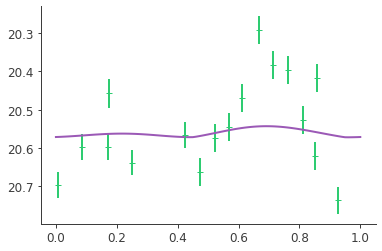

In [14]:
plt.plot(np.arange(0, 1.01, 0.01), PPC_per_band(my_model, 'gband', gdata, 1).transpose())
plt.gca().invert_yaxis()
plt.errorbar(gdata.x, gdata.y, gdata.yerr, None, '+')

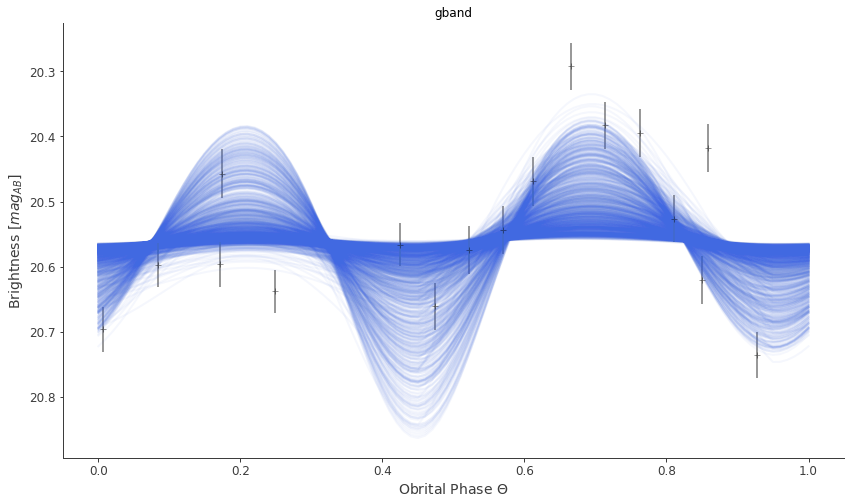

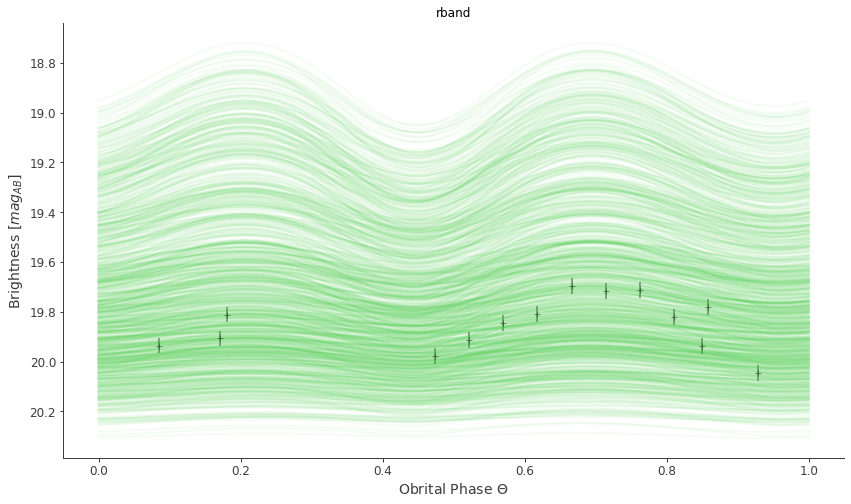

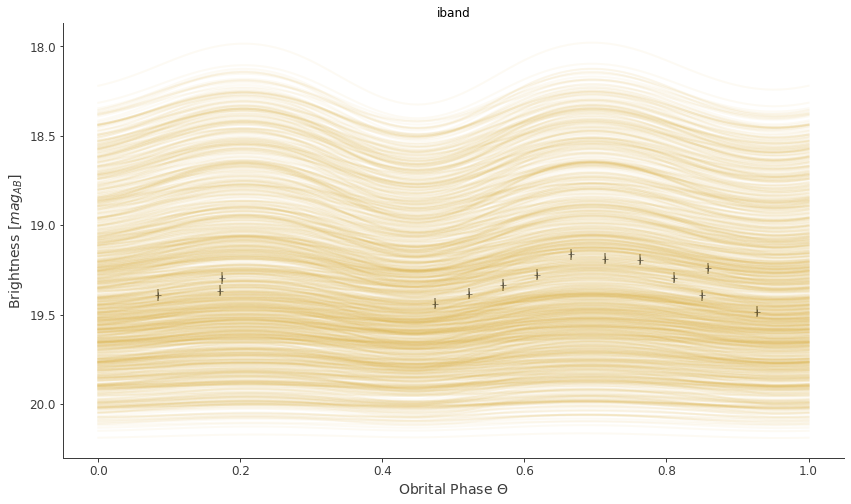

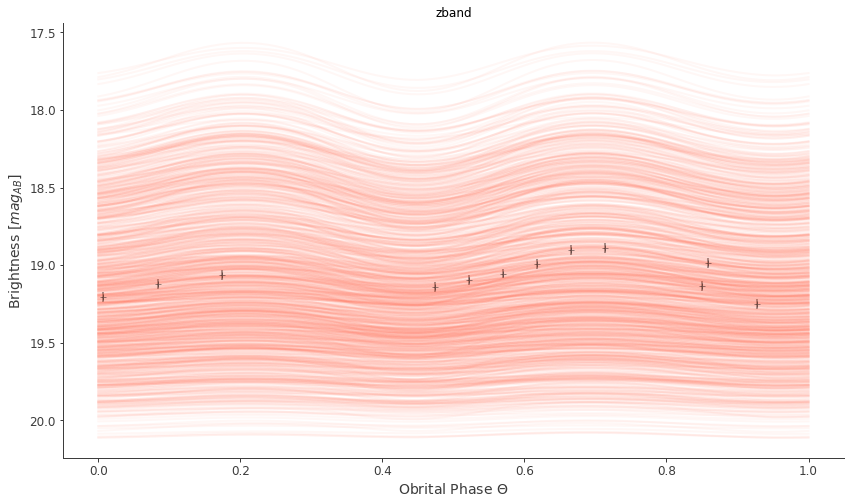

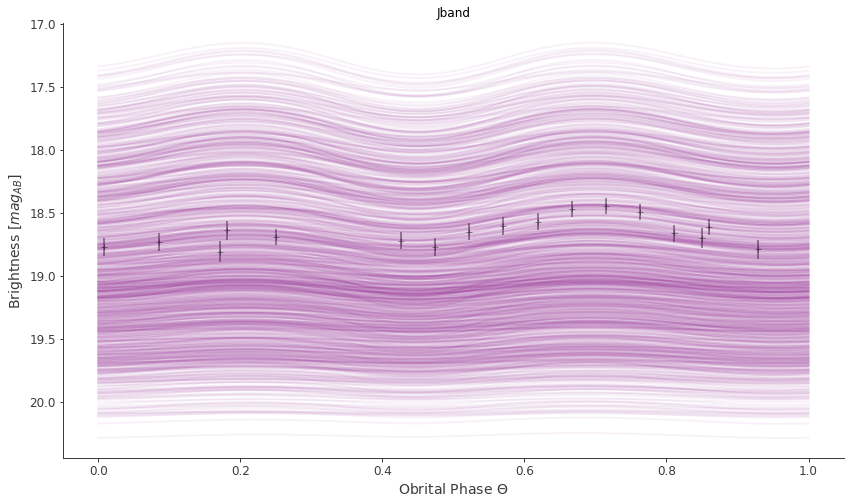

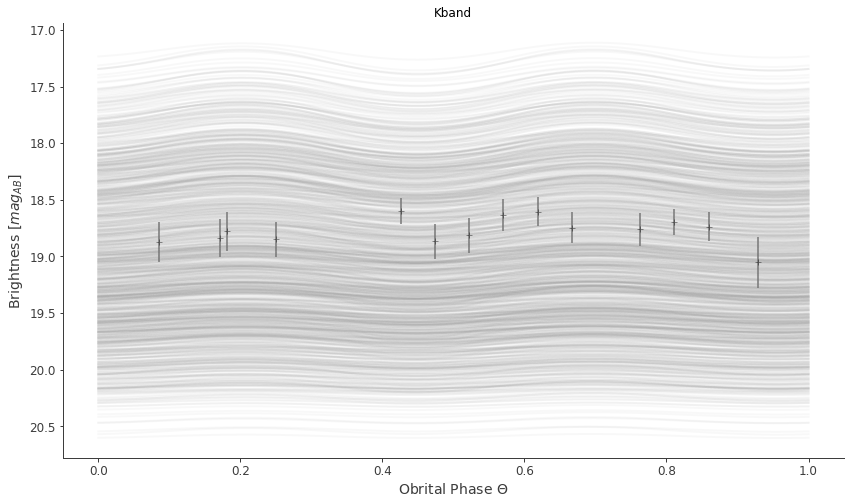

In [20]:
n_sim = 1000

phases = np.arange(0, 1.01, 0.01)

lColor = ['royalblue', 'limegreen', 'goldenrod', 'tomato', 'purple', 'grey']

for index, band_data in enumerate(data.values()):
    
    plt.figure(figsize=(14, 8))
    plt.gca().invert_yaxis()
    plt.xlabel('Obrital Phase $\Theta$')
    plt.ylabel('Brightness [$mag_{AB}$]')
    plt.title(filter_list[index])
    
    band_PPC = PPC_per_band(my_model, filter_list[index], dataset=band_data, n_sim=n_sim)
    
    for i in range(n_sim):
    
        plt.plot(phases, band_PPC[i], color=lColor[index], alpha=0.05)
    
    plt.errorbar(band_data.x, band_data.y, band_data.yerr, None, 'k+', alpha=0.4)
    
plt.show()

## A0620 section

In [2]:
pa = '/home/yahecker/Obs_Data/A0620/'
data_path = pa + 'flux_%s_fit.txt'%'g_red'
gdata = XYLike.from_text_file("gdata", data_path)
gdata.assign_to_source(source_name = 'gband_source')

data_path = pa +'flux_%s_fit.txt'%'r_red'
rdata = XYLike.from_text_file("rdata", data_path)
rdata.assign_to_source(source_name = 'rband_source')

data_path = pa +'flux_%s_fit.txt'%'i_red'
idata = XYLike.from_text_file("idata", data_path)
idata.assign_to_source(source_name = 'iband_source')

data_path = pa +'flux_%s_fit.txt'%'z_red'
zdata = XYLike.from_text_file("zdata", data_path)
zdata.assign_to_source(source_name = 'zband_source')

data_path = pa +'flux_%s_fit.txt'%'J_red'
Jdata = XYLike.from_text_file("Jdata", data_path)
Jdata.assign_to_source(source_name = 'Jband_source')

data_path = pa +'flux_%s_fit.txt'%'H_red'
Hdata = XYLike.from_text_file("Hdata", data_path)
Hdata.assign_to_source(source_name = 'Hband_source')

data_path = pa +'flux_%s_fit.txt'%'K_red'
Kdata = XYLike.from_text_file("Kdata", data_path)
Kdata.assign_to_source(source_name = 'Kband_source')

data = DataList(gdata, rdata, idata, zdata, Jdata, Hdata, Kdata)

15:28:59 INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=134940;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=89671;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=630601;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=45456;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=638338;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=161663;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=400674;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=918432;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=808130;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=139883;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=223431;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=571872;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

         INFO      Using Gaussian statistic (equivalent to chi^2) with the provided errors.            ]8;id=500780;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py\XYLike.py]8;;\:]8;id=525338;file:///home/yahecker/.virtualenvs/3ML/lib/python3.8/site-packages/threeML/plugins/XYLike.py#89\89]8;;\

In [3]:
extinction_factors = {'g':1.282,
                      'r':0.897,
                      'i':0.641,
                      'z':0.513,
                      'J':0.385,
                      'H':0.256,
                      'K':0.128
                     }

In [4]:
def ModeltoPointSource(band):
    star = TemplateModel('A06_f_noHS_star_%s'%band, log_interp = False)
    star.K.fix = False
    star.scale.fix = True
    
    disc = TemplateModel('A06_f_noHS_disc_%s'%band, log_interp = False)
    disc.K.fix = False
    disc.scale.fix = True
    
    print(f'Loaded {band} model.')
    
    return PointSource('%s_source'%band, 0, 0, components=[SpectralComponent('Star', star), SpectralComponent('Disc', disc)])


filter_list = ['gband', 'rband', 'iband', 'zband', 'Jband', 'Hband', 'Kband']
point_source_list = ['ps_g', 'ps_r', 'ps_i', 'ps_z', 'ps_J', 'ps_H', 'ps_K']
PointSdict = {}
for h in range(len(filter_list)):
    PointSdict[point_source_list[h]] = ModeltoPointSource(filter_list[h])

my_model = Model(PointSdict['ps_g'], PointSdict['ps_r'],
                 PointSdict['ps_i'], PointSdict['ps_z'],
                 PointSdict['ps_J'], PointSdict['ps_H'], PointSdict['ps_K'])

Loaded gband model.
Loaded rband model.
Loaded iband model.
Loaded zband model.
Loaded Jband model.
Loaded Hband model.
Loaded Kband model.


In [5]:
parameter_Extinction = Parameter(name='A_V',
                                 value=0.,
                                 min_value=0,
                                 max_value=2,
                                 # free=True,
                                 free=False,
                                 unit='',
                                 delta=0.05)

my_model.add_external_parameter(parameter_Extinction)

In [6]:
class FilterbandExtinctionFunction(Function1D, metaclass=FunctionMeta):
    r"""
    description :
        A function for calculating the extinction over a band with a pivot band
    latex : $ F_\lambda = K \cdot 10^{-0.4 \cdot k_{band} \cdot A_V} $
    parameters :
        K :
            desc : Normalization (differential flux without extinction)
            initial value : 1.0
            is_normalization : True
            fix : True
            min : 1e-30
            max : 1e3
            delta : 0.1
        k_band :
            desc : band dependent ratio of extinction in this band relative to Johnson V band ( $ A_\lambda/A_V $ )
            initial value : 1.0
            fix : yes
            min : -2
            max : 5
    """
    
    def _set_units(self, x_unit, y_unit):
        # The extinction constants are all dimensionless
        self.k_band.unit = u.dimensionless_unscaled

        # The normalization has the same units as the flux

        self.K.unit = y_unit


    def evaluate(self, x, K, k_band):

        return K * np.power(10, -0.4 * k_band * x)

In [7]:
my_model.link(my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['g'] - extinction_factors['g']))
my_model.link(my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['r'] - extinction_factors['g']))
my_model.link(my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['i'] - extinction_factors['g']))
my_model.link(my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['z'] - extinction_factors['g']))
my_model.link(my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['J'] - extinction_factors['g']))
my_model.link(my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['H'] - extinction_factors['g']))
my_model.link(my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['K'] - extinction_factors['g']))

my_model.link(my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['g'] - extinction_factors['g']))
my_model.link(my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['r'] - extinction_factors['g']))
my_model.link(my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['i'] - extinction_factors['g']))
my_model.link(my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['z'] - extinction_factors['g']))
my_model.link(my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['J'] - extinction_factors['g']))
my_model.link(my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['H'] - extinction_factors['g']))
my_model.link(my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.K, my_model.A_V, FilterbandExtinctionFunction(k_band=extinction_factors['K'] - extinction_factors['g']))

In [8]:
allInklParams =[my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.Inkl,
                my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.Inkl,
                my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.Inkl,
                my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.Inkl,
                my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.Inkl,
                my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.Inkl,
                my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.Inkl,
                my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.Inkl,
                my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.Inkl,
                my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.Inkl,
                my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.Inkl,
                my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.Inkl,
                my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.Inkl]

allT_SecParams = [my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.T_Sec,
                  my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.T_Sec,
                  my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.T_Sec,
                  my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.T_Sec,
                  my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.T_Sec,
                  my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.T_Sec,
                  my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.T_Sec,
                  my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.T_Sec,
                  my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.T_Sec,
                  my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.T_Sec,
                  my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.T_Sec,
                  my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.T_Sec,
                  my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.T_Sec]

allT_DiscParams = [my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.T_Disc,
                   my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.T_Disc,
                   my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.T_Disc,
                   my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.T_Disc,
                   my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.T_Disc,
                   my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.T_Disc,
                   my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.T_Disc,
                   my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.T_Disc,
                   my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.T_Disc,
                   my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.T_Disc,
                   my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.T_Disc,
                   my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.T_Disc,
                   my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.T_Disc]

allf_rParams = [my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.f_r,
                my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.f_r,
                my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.f_r,
                my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.f_r,
                my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.f_r,
                my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.f_r,
                my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.f_r,
                my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.f_r,
                my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.f_r,
                my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.f_r,
                my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.f_r,
                my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.f_r,
                my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.f_r]

allRinnerParams = [my_model.rband_source.spectrum.Star.A06_f_noHS_star_rband.R_in,
                   my_model.iband_source.spectrum.Star.A06_f_noHS_star_iband.R_in,
                   my_model.zband_source.spectrum.Star.A06_f_noHS_star_zband.R_in,
                   my_model.Jband_source.spectrum.Star.A06_f_noHS_star_Jband.R_in,
                   my_model.Hband_source.spectrum.Star.A06_f_noHS_star_Hband.R_in,
                   my_model.Kband_source.spectrum.Star.A06_f_noHS_star_Kband.R_in,
                   my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.R_in,
                   my_model.rband_source.spectrum.Disc.A06_f_noHS_disc_rband.R_in,
                   my_model.iband_source.spectrum.Disc.A06_f_noHS_disc_iband.R_in,
                   my_model.zband_source.spectrum.Disc.A06_f_noHS_disc_zband.R_in,
                   my_model.Jband_source.spectrum.Disc.A06_f_noHS_disc_Jband.R_in,
                   my_model.Hband_source.spectrum.Disc.A06_f_noHS_disc_Hband.R_in,
                   my_model.Kband_source.spectrum.Disc.A06_f_noHS_disc_Kband.R_in]

my_model.link(allInklParams, my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.Inkl)
my_model.link(allT_SecParams, my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.T_Sec)
my_model.link(allT_DiscParams, my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.T_Disc)
my_model.link(allRinnerParams, my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.R_in)
my_model.link(allf_rParams, my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.f_r)

In [5]:
my_model.display()

Model summary:
==============

                  N
Point sources     7
Extended sources  0
Particle sources  0

Free parameters (6):
--------------------

                             value min_value max_value unit
Xrb_Kband_source...Inkl       62.0      50.0      74.0     
Xrb_Kband_source...T_Sec    4400.0    3800.0    5000.0     
Xrb_Kband_source...T_Disc   2200.0    1500.0    2900.0     
Xrb_Kband_source...f_r         0.5       0.0       1.0     
Xrb_Kband_source...R_inner  5500.0    1000.0   10000.0     
Xrb_Kband_source...T_HS     6000.0    4000.0    8000.0     

Fixed parameters (40):
(abridged. Use complete=True to see all fixed parameters)


Linked parameters (36):
----------------------

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.Inkl
current value                                               62.0     
function                                                    Line     
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...     
unit                                                                 

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.T_Sec
current value                                             4400.0      
function                                                    Line      
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...      
unit                                                                  

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.T_Disc
current value                                             2200.0       
function                                                    Line       
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...       
unit                                                                   

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.f_r
current value                                                0.5    
function                                                    Line    
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...    
unit                                                                

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.R_inner
current value                                             5500.0        
function                                                    Line        
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...        
unit                                                                    

              Xrb_gband_source.spectrum.main.A06_f_Knorm_5_gband.T_HS
current value                                             6000.0     
function                                                    Line     
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...     
unit                                                                 

              Xrb_rband_source.spectrum.main.A06_f_Knorm_5_rband.Inkl
current value                                               62.0     
function                                                    Line     
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...     
unit                                                                 

              Xrb_rband_source.spectrum.main.A06_f_Knorm_5_rband.T_Sec
current value                                             4400.0      
function                                                    Line      
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...      
unit                                                                  

              Xrb_rband_source.spectrum.main.A06_f_Knorm_5_rband.T_Disc
current value                                             2200.0       
function                                                    Line       
linked to      Xrb_Kband_source.spectrum.main.A06_f_Knorm_5_K...       
unit                                                                   

              Xrb_rband_source.spectrum.main.A06_f_Knorm_5_rband.f_r
current value            

## Create true PPCs (i.e. simulate data based on parameters and check behaviour in comparison to true data)

In [7]:
test, _ = np.meshgrid(np.arange(10), np.ones(4))

In [22]:
test

array([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
       [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
       [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
       [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])

In [45]:
np.quantile(PPC_test_g, upper, axis=0)

array([0.90021323, 0.8364817 , 0.91219841, 0.77735837, 0.88121397,
       0.78754281, 0.86863206, 0.77370939, 0.8358893 , 0.79710193,
       0.87958016, 0.79637517, 0.86970672])

In [63]:
minind = np.argmin(gdata.x)

In [64]:
minind

2

In [68]:
new_gdata_x = np.roll(gdata.x, -minind)
new_gdata_y = np.roll(gdata.y, -minind)
new_gdata_yerr = np.roll(gdata.yerr, -minind)

0.15999999999999998 0.8400000000000001


<ErrorbarContainer object of 3 artists>

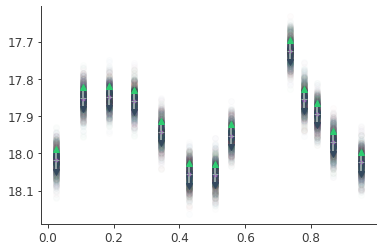

In [73]:
num_sims = 1000
size = np.size(gdata.x)

PPC_test_g = np.zeros((num_sims, size))

for j in range(num_sims):
    ### get posterior sample, set model, simulate dataset
    PPC_test_g[j] = np.random.normal(new_gdata_y, new_gdata_yerr, size=size)

total = 0.68
lower = 0.5 - total/2.
upper = 0.5 + total/2.
print(lower, upper)
plt.plot(new_gdata_x, np.quantile(PPC_test_g, 0.5, axis=0), '.')
plt.plot(new_gdata_x, np.quantile(PPC_test_g, lower, axis=0), '^')
plt.plot(new_gdata_x, np.quantile(PPC_test_g, upper, axis=0), 'v')
#plt.fill_between(new_gdata_x, np.quantile(PPC_test_g, upper, axis=0), np.quantile(PPC_test_g, lower, axis=0), color='#DDDDDD', step='mid')
for j in range(num_sims):
    plt.scatter(new_gdata_x, PPC_test_g[j], alpha=min([10./num_sims, 1]))
plt.gca().invert_yaxis()

plt.errorbar(gdata.x, gdata.y, gdata.yerr, None, '+')

## Test model: check consistency with parameters in XRbinary

In [9]:
def FluxToMag(flux, filtcorr, lambdaeff):
    return -2.5*np.log10(flux*filtcorr)-2.402-5.0*np.log10(lambdaeff)

In [40]:
def check_model_prediction(Inkl, T2, Tdisc, rout, rin, phaseoffset=0, number=0):
    
    print(Inkl, T2, Tdisc, rout, rin, phaseoffset)
    
    
    fig, ax = plt.subplots(figsize=(12,9))
    fig2, ax2 = plt.subplots(figsize=(12,9))
    
    phases = np.arange(0.0, 1.01, 0.01)
    lColor = ['royalblue', 'limegreen', 'goldenrod', 'tomato', 'purple', 'orange', 'grey']
    leff = np.array([4586, 6220, 7641, 8989, 12398, 16468, 21706], dtype=np.float64)
    
    ### set the parameters in the model for the prediction
    my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.Inkl.value = Inkl
    my_model.gband_source.spectrum.Star.A06_f_noHS_star_gband.T_Sec.value = T2
    my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.T_Disc.value = Tdisc
    my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.f_r.value = rout
    my_model.gband_source.spectrum.Disc.A06_f_noHS_disc_gband.R_in.value = rin
    my_model.A_V.value = 0.
    
    ### plot the predicted lightcurve
    
    temp = np.zeros((len(phases), 7))
    for co, (source_name, point_source) in enumerate(my_model.point_sources.items()):
        # temp[:, co] = FluxToMag(point_source.spectrum.Star.shape(phases) + point_source.spectrum.Disc.shape(phases),
                                # 1,
                                # leff[co])
        temp[:, co] = point_source.spectrum.Star.shape(phases) + point_source.spectrum.Disc.shape(phases)
        # ax.plot(phases, temp[:, co], # point_source.spectrum.Star.shape(phases) + point_source.spectrum.Disc.shape(phases),
        ax.plot(phases, point_source.spectrum.Star.shape(phases),
            '--', c = lColor[co], alpha=0.4, label = 'Model')
        ax.plot(phases, point_source.spectrum.Disc.shape(phases),
            '--', c = lColor[co], alpha=0.4)
        ax2.plot(phases, temp[:, co],
            '--', c = lColor[co], alpha=0.8, label = 'Model')
    
    ### change the single_xrb_file.py script for the specific parameter combination
    
    ## reading in file
    with open('single_xrb_file.py', 'r') as root:
        lines = root.readlines()
        
        ## creating empty file to write into
        with open('gone_in_a_second.py', 'w') as branch:
        
            for line in lines:
                ## replace parameters in mother file
                if 'Inkl =' in line:
                    line = line.replace(line.split(' = ')[1], str(Inkl)+'\n')
                if 'T_Sec =' in line:
                    line = line.replace(line.split(' = ')[1], str(T2)+'\n')
                if 'T_Disc =' in line:
                    line = line.replace(line.split(' = ')[1], str(Tdisc)+'\n')
                if 'f_r =' in line:
                    line = line.replace(line.split(' = ')[1], str(rout)+'\n')
                if 'R_inner =' in line:
                    line = line.replace(line.split(' = ')[1], str(rin)+'\n')
                # if 'T_HS =' in line:
                    # line = line.replace(line.split(' = ')[1], str(Ths)+'\n')
                if 'phaseoffset =' in line:
                    line = line.replace(line.split(' = ')[1], str(phaseoffset)+'\n')                    
                branch.write(line)
        
    ### execute the modified file
    
    os.system('python gone_in_a_second.py')
    
    ### plot the results
    
    # xrb_output = np.loadtxt("XRbparallel/XRbpar1/{}{}{}{}{}".format(Inkl, T2, Tdisc, rout, rin))
    with h5py.File('/data/yahecker/A0620/dump/{}_{}_{}_{}_{}.h5'.format(Inkl, T2, Tdisc, rout, rin), 'r') as readin:
        _1 = readin['Star'][1:8].transpose()
        _2 = readin['Disc'][1:8].transpose()
    
    # xrb_output = _1 + _2
    
    # for j in range(1, 8):
    for j in range(7):
        # ax.plot(phases, FluxToMag(xrb_output[:, j], 1, leff[j]), '-', c=lColor[j], alpha=0.8, label='XRB output')
        # ax.plot(phases, xrb_output[:, j], '-', c=lColor[j], alpha=0.8, label='XRB output')
        ax.plot(phases, _1[:, j], '-', c=lColor[j], alpha=0.4, label='XRB output')
        ax.plot(phases, _2[:, j], '-', c=lColor[j], alpha=0.4)
        ax2.plot(phases, _1[:, j] + _2[:, j], '-', c=lColor[j], alpha=0.8, label='XRB output')
        
    ax.set_xlabel(r"Orbital Phase", fontsize=20)
    handles, labels = ax.get_legend_handles_labels()
    handles_up = [Line2D([0], [0], color = 'k', linestyle='--'), Line2D([0], [0], color = 'k', linestyle='-')]
    ax.legend(handles_up, (labels[0], labels[-1]), fontsize =20, loc = 1)
    ax.set_ylabel("Magnitude [AB]", fontsize =20)
    ax.tick_params(axis = 'both', direction = 'in', top = True, right = True, labelsize = 15)
    ax.set_yscale('log')
    
    ax2.set_xlabel(r"Orbital Phase", fontsize=20)
    # handles, labels = ax.get_legend_handles_labels()
    # handles_up = [Line2D([0], [0], color = 'k', linestyle='--'), Line2D([0], [0], color = 'k', linestyle='-')]
    ax2.legend(handles_up, (labels[0], labels[-1]), fontsize =20, loc = 1)
    ax2.set_ylabel("Magnitude [AB]", fontsize =20)
    ax2.tick_params(axis = 'both', direction = 'in', top = True, right = True, labelsize = 15)
    
    plt.title('Parameters: i={}, T2={}, Td={}, f_r={}, R_in={}'.format(Inkl, T2, Tdisc, rout, rin))
    # plt.gca().invert_yaxis()
    plt.tight_layout()
    
    # plt.savefig('Model_validation_test_{:02d}.pdf'.format(number), format='pdf')
    
    plt.show()
    
    # diff = temp - xrb_output[:, 1:]
    # print('Mean offset over lightcurves:\t\t{}+/-{}\nFraction of lightcurve with the offset:\t{}'.format(np.mean(diff), np.std(diff), np.mean(np.isclose(diff, np.mean(diff), rtol=1e-3))))
    
    ### clean up
    
    os.system('rm XRbparallel/XRbpar1/{}{}{}{}{}*'.format(Inkl, T2, Tdisc, rout, rin))
    
    

In [51]:
my_model.A_V.alue = 0

In [21]:
h5file = h5py.File('/data/yahecker/A0620/dump/54.41_3769.18_4018.31_0.26_3769.8.h5', 'r')

62.8 5019.62 3300.61 0.26 7861.55 -0.06


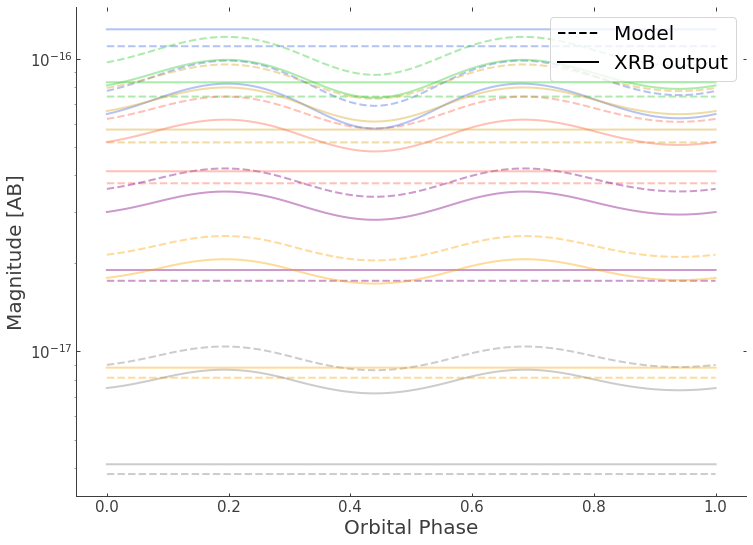

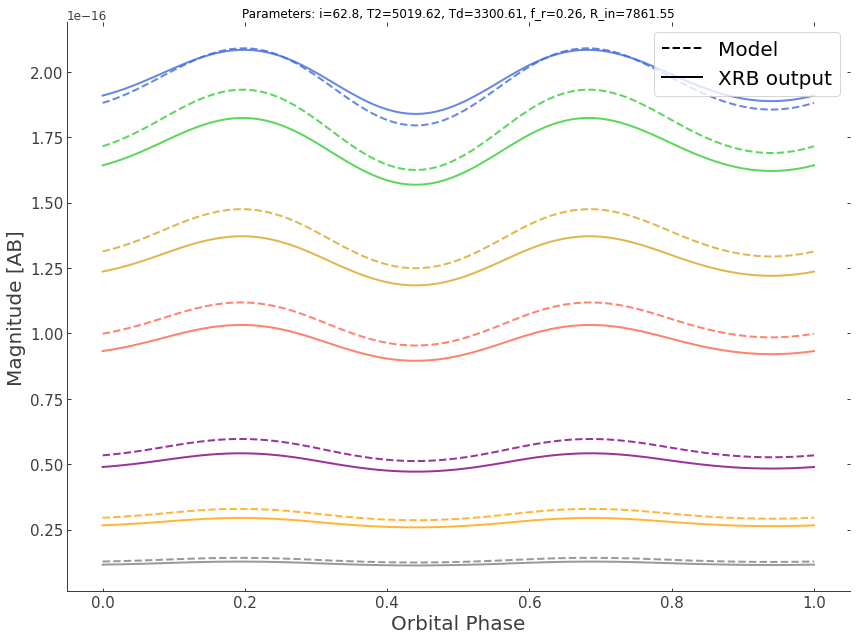

70.23 5132.17 4380.2 0.51 5221.9 -0.06


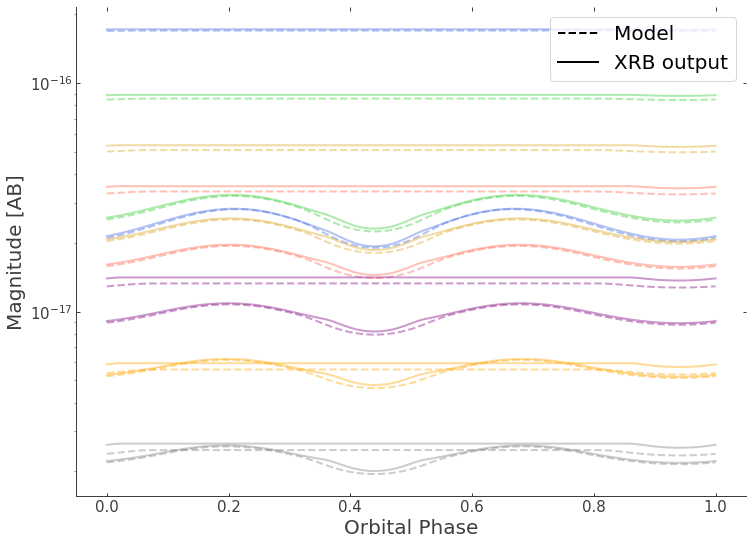

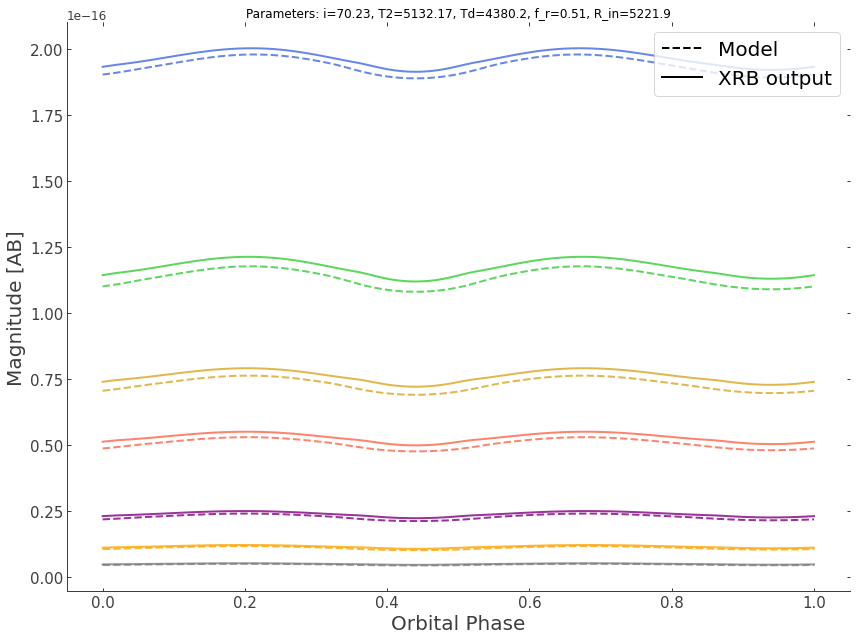

0

In [41]:
number = 2
phaseoffset = -0.06
Inkl_vals = np.round(np.random.uniform(46, 74, number), 2)
T2_vals = np.round(np.random.uniform(3750, 5250, number), 2)
TD_vals = np.round(np.random.uniform(1000, 4500, number), 2)
fr_vals = np.round(np.random.uniform(0., 1., number), 2)
Ri_vals = np.round(np.random.uniform(1000, 10000, number), 2)
# TH_vals = np.round(np.random.uniform(4000, 8000, number), 2)

for num in range(number):
    check_model_prediction(Inkl_vals[num], T2_vals[num], TD_vals[num], fr_vals[num], Ri_vals[num], phaseoffset, num)
os.system('rm gone_in_a_second.py')

## Check how shifting the hotspot in LC file behaves relative to XBR output

In [17]:
def Flux_to_mag(flux,lambdaeff):
    return -2.5*np.log10(flux) - 2.402 - 5.0*np.log10(lambdaeff*1.e-10)

def new_array(old_arr, shift):
    '''old_arr of length 101 (phases) is returned as new_arr with same length
    but indices shifted by shift (given in degrees).'''
    new_arr = np.zeros_like(old_arr)
    new_arr[:-1] = np.roll(old_arr[:-1], int(shift//3.6))
    new_arr[-1] = new_arr[0]    # last index same as first (phase 0 = phase 1)
    return new_arr

def filereader(infile, shift):
    '''Open the .LC type <infile> and compute a new total flux
    with the hotspot shifted by <shift> degrees.'''
    temp = np.loadtxt(infile, skiprows=5, usecols=(3, 4, 7, 8, 11, 12, 15, 16, 19, 20, 23, 24, 27, 28), unpack=True)
    LambdaMean = np.array([4586, 6220, 7641, 8989, 12398, 16468, 21706])
    phases = np.arange(0, 1.01, 0.01)
    g_temp = Flux_to_mag(temp[1] + new_array(temp[0], shift), LambdaMean[0])
    r_temp = Flux_to_mag(temp[3] + new_array(temp[2], shift), LambdaMean[1])
    i_temp = Flux_to_mag(temp[5] + new_array(temp[4], shift), LambdaMean[2])
    z_temp = Flux_to_mag(temp[7] + new_array(temp[6], shift), LambdaMean[3])
    J_temp = Flux_to_mag(temp[9] + new_array(temp[8], shift), LambdaMean[4])
    H_temp = Flux_to_mag(temp[11] + new_array(temp[10], shift), LambdaMean[5])
    K_temp = Flux_to_mag(temp[13] + new_array(temp[12], shift), LambdaMean[6])
    return np.array([phases, g_temp, r_temp, i_temp, z_temp, J_temp, H_temp, K_temp])

def head_extr(infile):
    File = open(infile.strip('.LC'), 'r')
    t = File.readlines()
    File.close()
    return t[0].strip('# ') + t[1].strip('# ')      # get rid of leading comment signs

def filewriter(infile, content):
    head = head_extr(infile)
    np.savetxt(infile.strip('.LC')+'_TEMP', content, header=head, fmt='%.6f')

def shifting_loop(infile, shift, normaldir='', lcdir='', corrdir=''):
    data_new = np.transpose(np.array(filereader(lcdir + infile + '.LC', shift)))
    filewriter(normaldir + infile, data_new)
    os.system('mv %s %s'%(normaldir + infile + "_TEMP", corrdir + infile))
    return data_new

def entire_loop(infile, angle_shift, normaldir='', lcdir='', corrdir=''):
    
    ### get the normal data
    infile_data = np.loadtxt(normaldir+infile, unpack=True) + 50
    
    ### get the manually shifted data
    manually_shifted = shifting_loop(infile, angle_shift, normaldir, lcdir, corrdir)
    
    fig, ax = plt.subplots(figsize=(12, 9))
    phases = np.arange(0.0, 1.01, 0.01)
    lColor = ['royalblue', 'limegreen', 'goldenrod', 'tomato', 'purple', 'orange', 'grey']
    
    for j in range(1, 8):
        ax.plot(phases, manually_shifted[:, j], '--', color=lColor[j-1], label='Manual shifting')
        ax.plot(phases, infile_data[j], ':', color=lColor[j-1])
    
    parlist = infile.split('/')[-1]
    
    Inkl = parlist[0:2]
    T2 = parlist[2:6]
    Tdisc = parlist[6:10]
    rout = str(np.round(float(parlist[10:15])/1000, 1))
    rin = parlist[15:-4]
    Ths = parlist[-4:]
            
    ### change the single_xrb_file.py script for the specific parameter combination
    
    ## reading in file
    with open('single_xrb_file.py', 'r') as root:
        lines = root.readlines()
        
        ## creating empty file to write into
        with open('gone_in_a_second.py', 'w') as branch:
        
            for line in lines:
                ## replace parameters in mother file
                if 'Inkl =' in line:
                    line = line.replace(line.split(' = ')[1], str(Inkl)+'\n')
                if 'T_Sec =' in line:
                    line = line.replace(line.split(' = ')[1], str(T2)+'\n')
                if 'T_Disc =' in line:
                    line = line.replace(line.split(' = ')[1], str(Tdisc)+'\n')
                if 'f_r =' in line:
                    line = line.replace(line.split(' = ')[1], str(rout)+'\n')
                if 'R_inner =' in line:
                    line = line.replace(line.split(' = ')[1], str(rin)+'\n')
                if 'T_HS =' in line:
                    line = line.replace(line.split(' = ')[1], str(Ths)+'\n')
                if 'phaseoffset =' in line:
                    line = line.replace(line.split(' = ')[1], str(phaseoffset)+'\n')
                if "parameters['DISKEDGET']=" in line:
                    line = line.replace(line.split(',')[2], str(100 + angle_shift))
                branch.write(line)
        
    ### execute the modified file
    
    os.system('python gone_in_a_second.py')
    
    ### plot the results
    
    xrb_output = np.loadtxt("{}{}{}{}{}{}".format(Inkl, T2, Tdisc, rout, rin, Ths))
    
    for j in range(1, 8):
        ax.plot(phases, xrb_output[:, j], '-', c=lColor[j-1], alpha=0.8, label='XRB output')
        
    ax.set_xlabel(r"Phase $\theta$", fontsize=20)
    handles, labels = ax.get_legend_handles_labels()
    handles_up = [Line2D([0], [0], color = 'k', linestyle='--'), Line2D([0], [0], color = 'k', linestyle=':'), Line2D([0], [0], color = 'k', linestyle='-')]
    ax.legend(handles_up, (labels[0], 'Reference', labels[-1]), fontsize =20, loc = 1)
    ax.set_ylabel("Magnitude [AB]", fontsize =20)
    ax.tick_params(axis = 'both', direction = 'in', top = True, right = True, labelsize = 15)
    
    plt.title('Parameters: i={}, T2={}, Td={}, f_r={}, R_in={}, T_HS={}'.format(Inkl, T2, Tdisc, rout, rin, Ths))
    plt.gca().invert_yaxis()
    plt.tight_layout()
    
    # plt.savefig('Model_validation_test_{:02d}.pdf'.format(number), format='pdf')
    
    plt.show()
    
    ### clean up
    
    os.system('rm {}{}{}{}{}{}*'.format(Inkl, T2, Tdisc, rout, rin, Ths))
    os.system('rm gone_in_a_second.py')

-30 -8.333333333333334


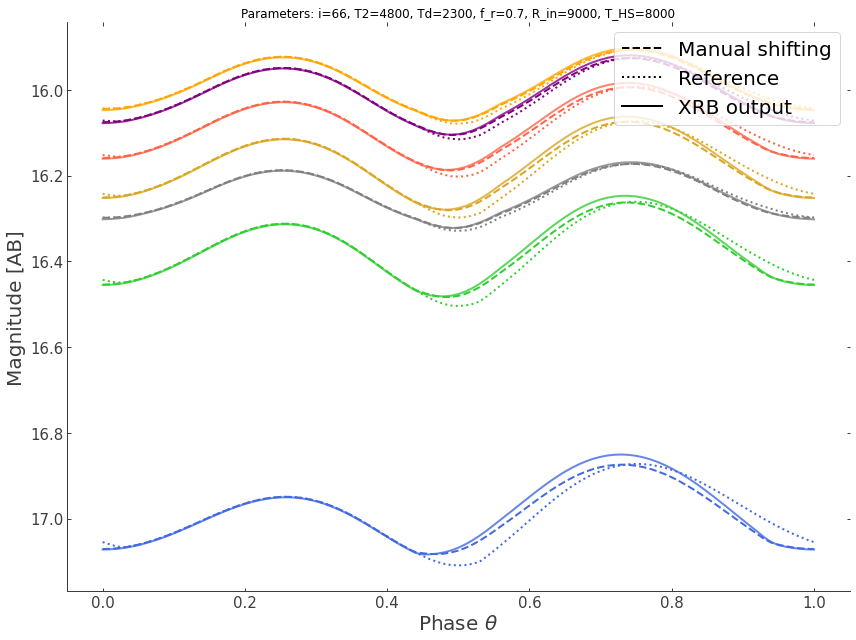

-25 -6.944444444444445


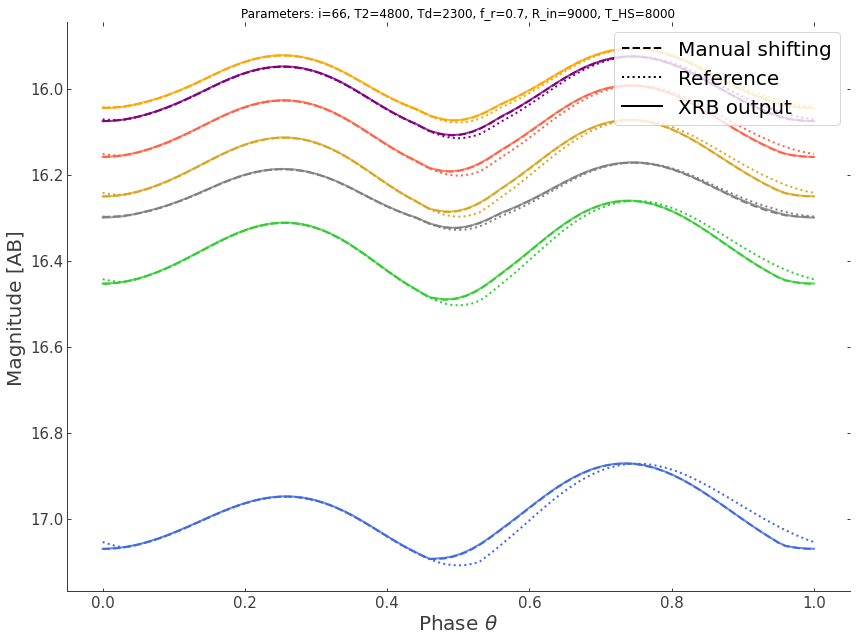

-20 -5.555555555555555


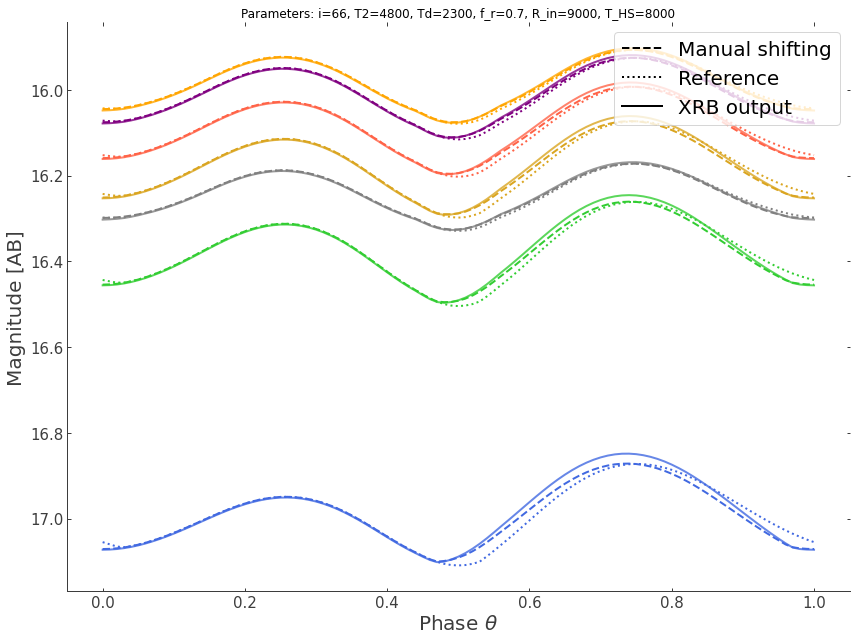

-15 -4.166666666666667


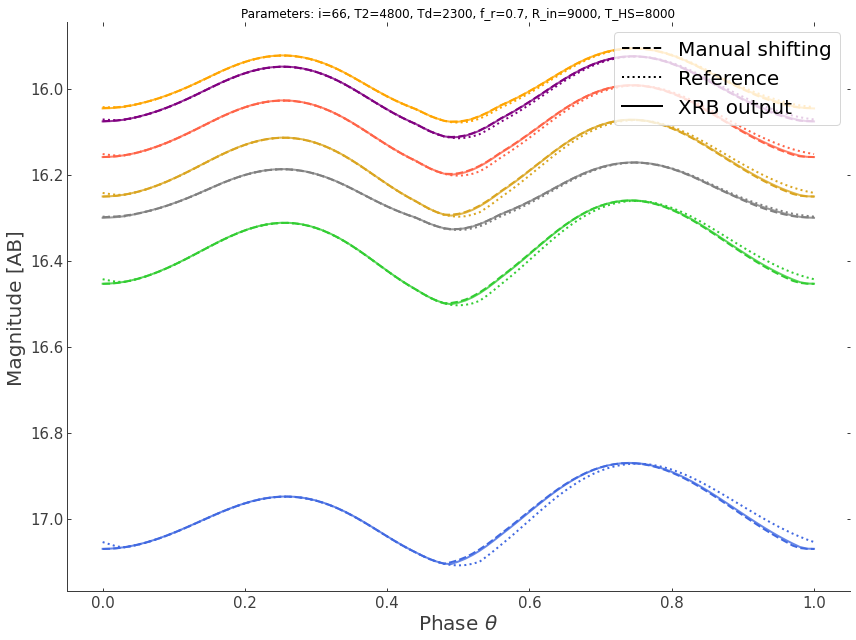

-10 -2.7777777777777777


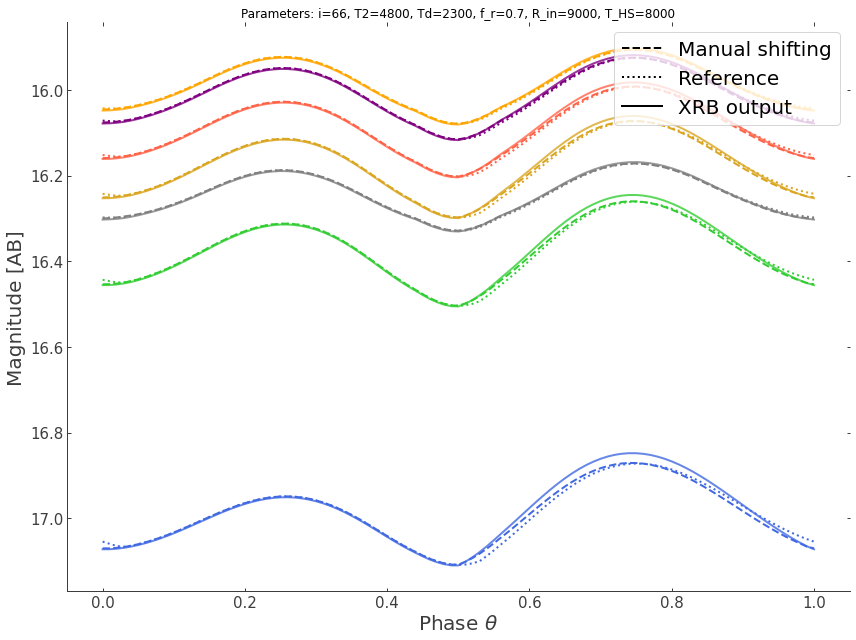

-5 -1.3888888888888888


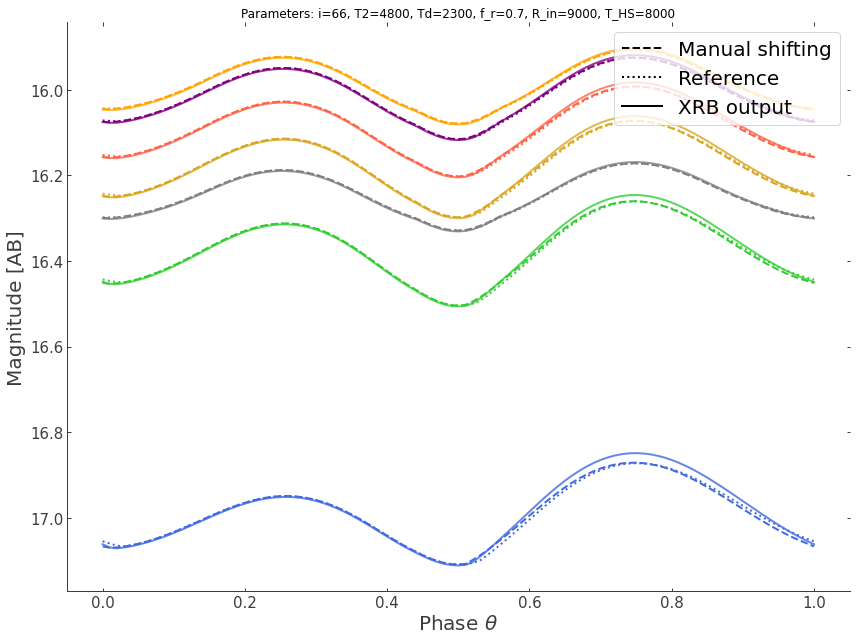

0 0.0


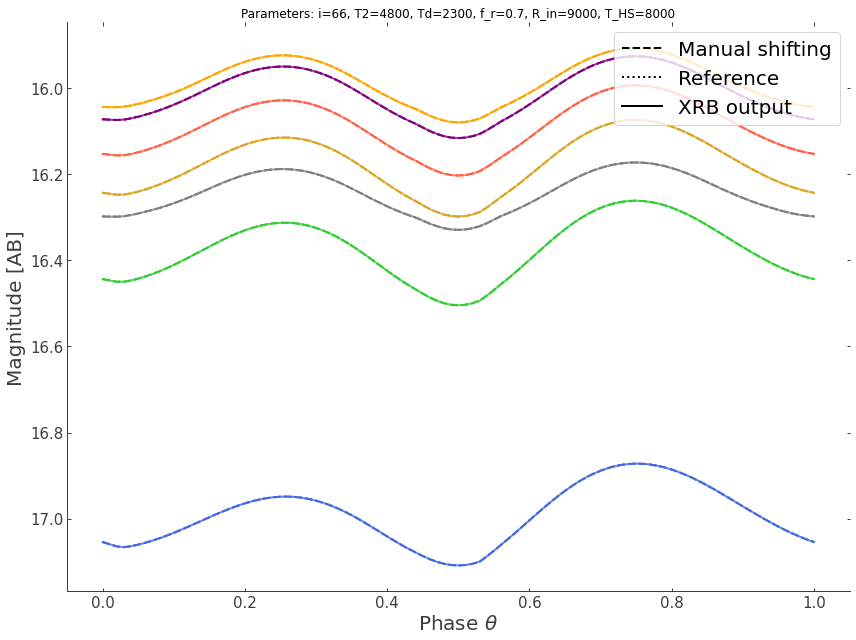

5 1.3888888888888888


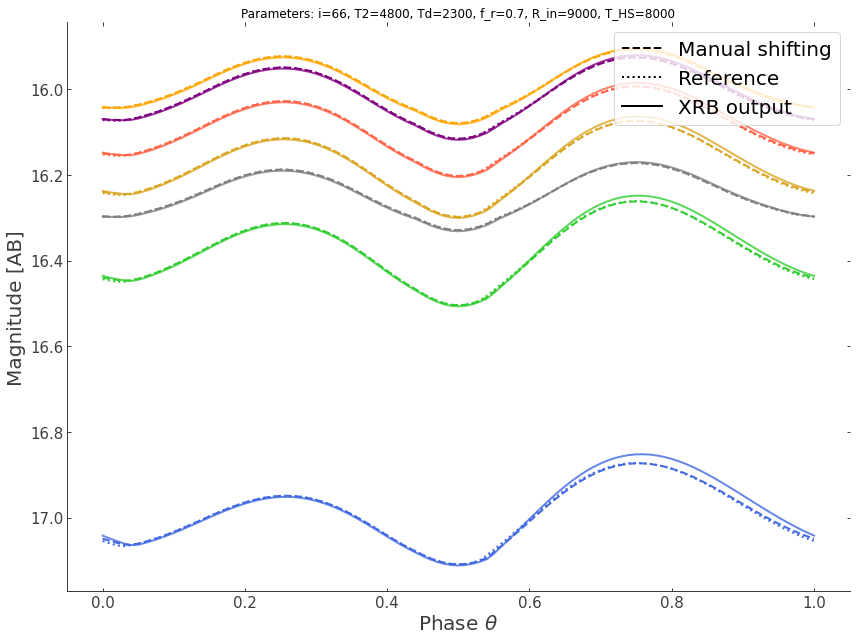

10 2.7777777777777777


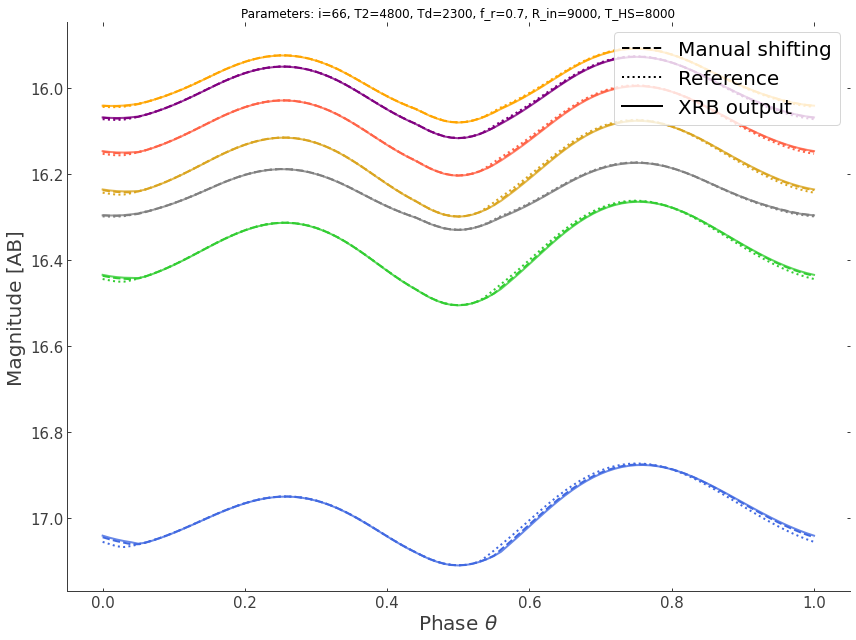

15 4.166666666666667


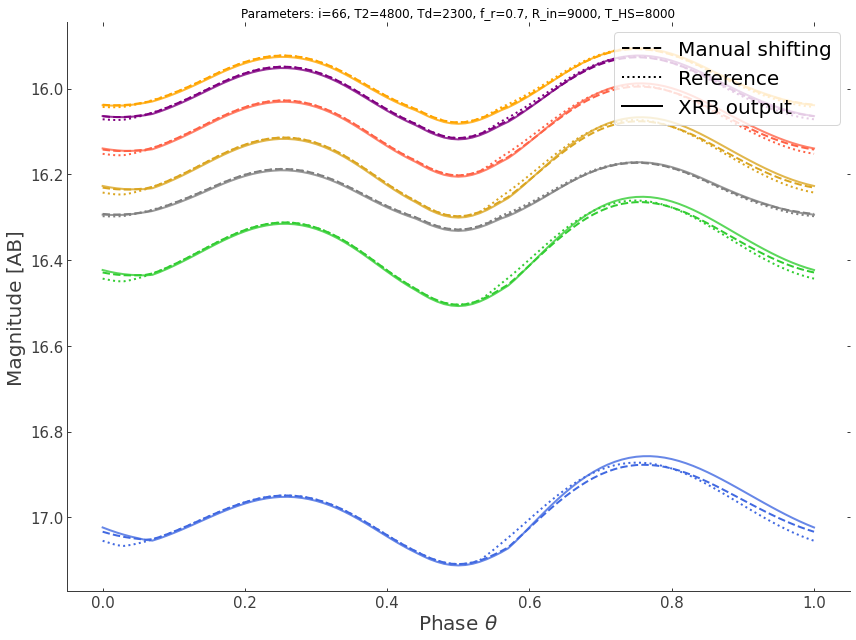

20 5.555555555555555


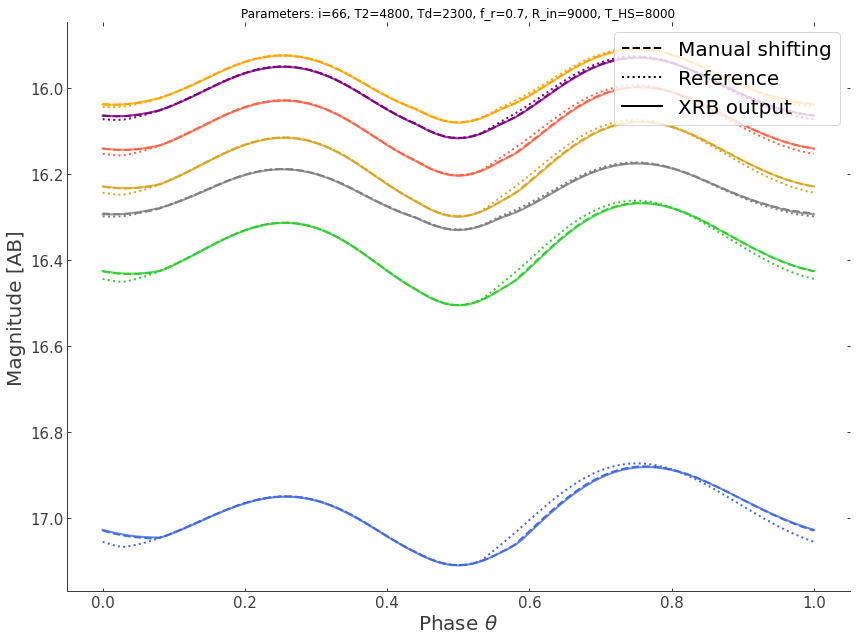

25 6.944444444444445


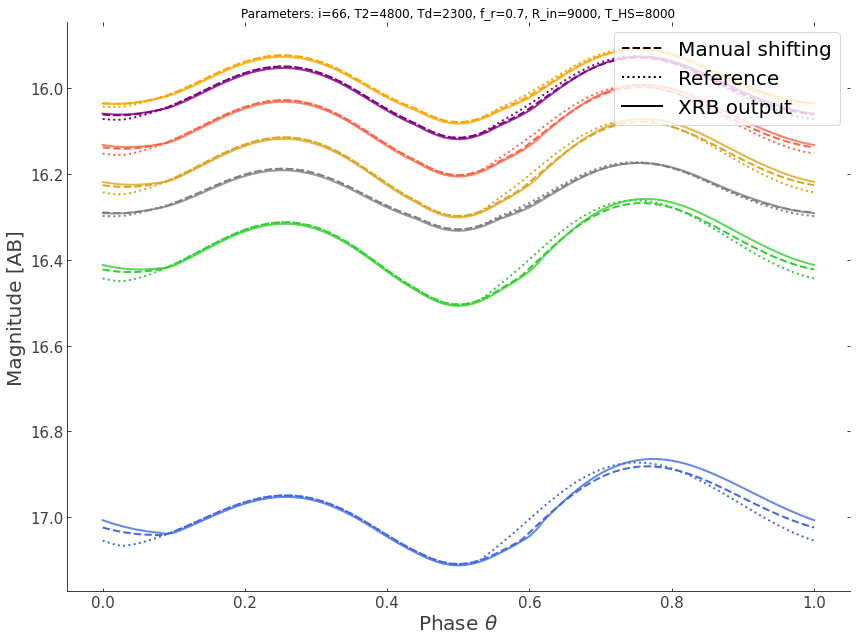

In [18]:
infile = '66480023000070090008000'
normaldir = '/data/yahecker/A0620/DscaleGrid/'
lcdir = normaldir + 'LCfiles/'
corrdir = ''

phaseoffset = 0
test_shift_list = np.arange(-30, 30, 5)

for test_shift in test_shift_list:
    print(test_shift, test_shift/3.6)
    entire_loop(infile, test_shift, normaldir, lcdir, corrdir)

In [5]:
def compplot2(params,ax,i,bands_data,band):
    phases = np.arange(0,1.01,0.01)
    #bands_data = [gdata,rdata,idata,zdata,Jdata,Hdata,Kdata]
    #
    #lColor = ['goldenrod']
    lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.Inkl.value = params[0]
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.T_Sec.value = params[1]
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.T_Disc.value = params[2]
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.f_r.value = params[3]
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.R_inner.value = params[4]
    my_model.Xrb_zband_source.spectrum.main.A06_f_5_zband.T_HS.value = params[5]    
    
    
    
    for co,(source_name, point_source) in enumerate(my_model.point_sources.items()):
        if source_name == band:
            ax.plot(phases,point_source.spectrum.main.shape(phases),
                '-',c = lColor[co],alpha=0.1,lw=.5 ,label = 'Model')#label= "%s" %(point_source))
        else:
            continue
                
        
        

    co = 0
    if i == 0:
        for band in bands_data:
            ax.errorbar(band.x,band.y,yerr = band.yerr, fmt ='.', label = 'GROND '+ band.name[0] +' data', c = 'black')
            co+=1

In [6]:
def plotppc(band, bands_data, band_ind, priorparams):
    phases = np.arange(0,1.01,0.01)
    fig, ax = plt.subplots(figsize=(12,7))
    lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
    with use_astromodels_memoization(False):
        for  ev, parameterset in enumerate(priorparams): 

            #print parameterset
            compplot2(parameterset, ax, ev, bands_data, band)
    
    
    ax.set_xlabel(r"Phase $\theta$",fontsize =20)
    handles, labels = ax.get_legend_handles_labels()
    handles_up = [Line2D([0], [0], color = lColor[band_ind]), handles[-1]]
    ax.legend(handles_up, (labels[0], labels[-1]), fontsize =20, loc = 1)
    ax.set_ylabel("Magnitude [AB]", fontsize =20)
    ax.tick_params(axis = 'both', direction = 'in', top = True, right = True, labelsize = 15)#, length = 10, width = 2)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    #fig.savefig('Plots/PPC%snew.png'%band)

In [8]:
def drawfromprior(seed,low,high,size):
    # np.random.seed(seed)
    return np.random.uniform(low, high, size)

In [7]:
def drawfromprior_1(low, high, size):
    # np.random.seed(seed)
    return np.random.uniform(low, high, size)

In [57]:
## used priors
size = 500
Inklprior = drawfromprior(54,34,74,size)
T_secprior = drawfromprior(4500,3800,5200,size)
Dtempprior = drawfromprior(2000,1100,2900,size)
Dsizeprior = drawfromprior(1,0.5,0.999,size)
Rinnerprior = drawfromprior(5000,1000,9000,size)
HSTempprior = drawfromprior(6000,3000,9000,size)
priorparams = np.stack((Inklprior, T_secprior, Dtempprior, Dsizeprior, Rinnerprior, HSTempprior), axis=1)


In [8]:
## testing priors
size = 1000
Inklprior = drawfromprior_1(54, 74, size)
T_Secprior = drawfromprior_1(3800, 5000, size)
T_Discprior = drawfromprior_1(1500, 2900, size)
f_rprior = drawfromprior_1(0.0, 1.0, size)
R_innerprior = drawfromprior_1(1000, 8000, size)
T_HSprior = drawfromprior_1(3000, 6000, size)
priorparams = np.stack((Inklprior, T_Secprior, T_Discprior, f_rprior, R_innerprior, T_HSprior), axis=1)

CPU times: user 43.7 s, sys: 2.09 s, total: 45.8 s
Wall time: 43.2 s


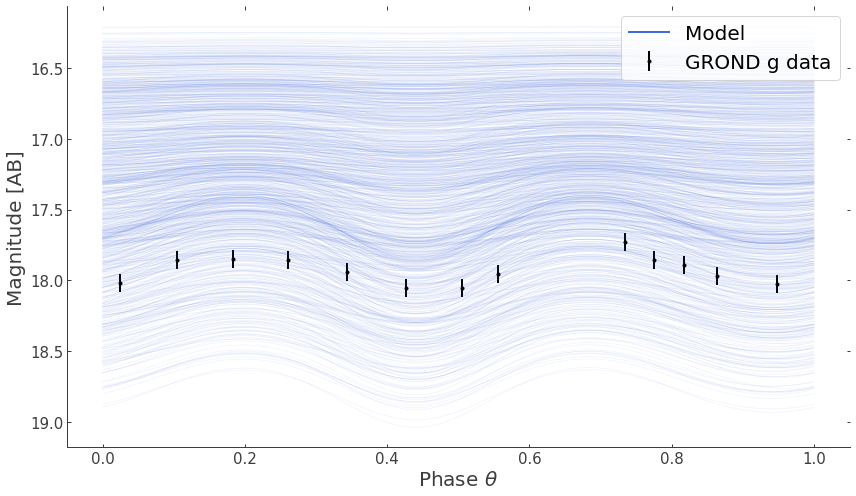

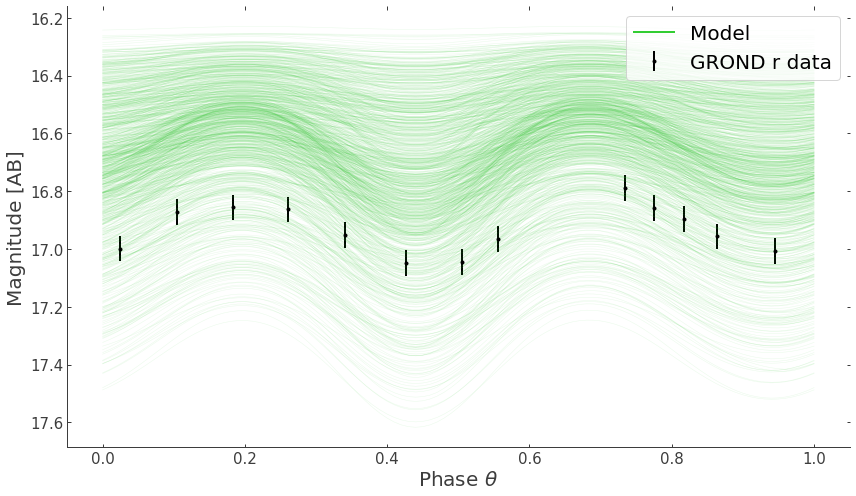

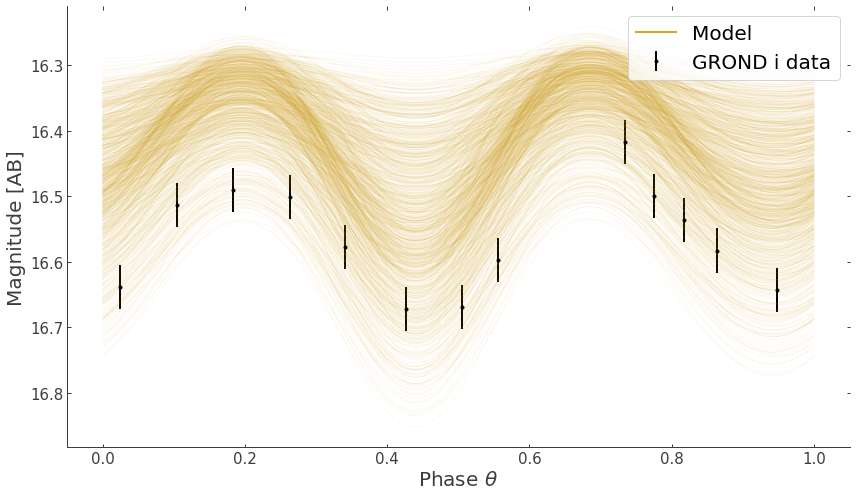

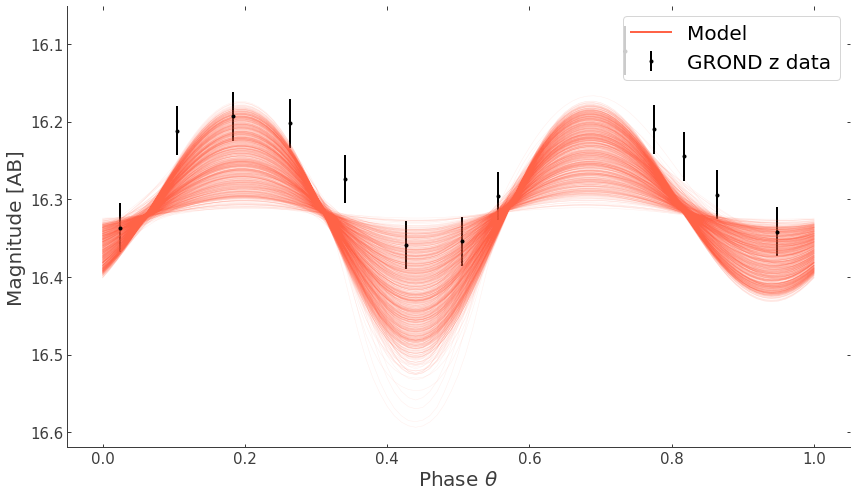

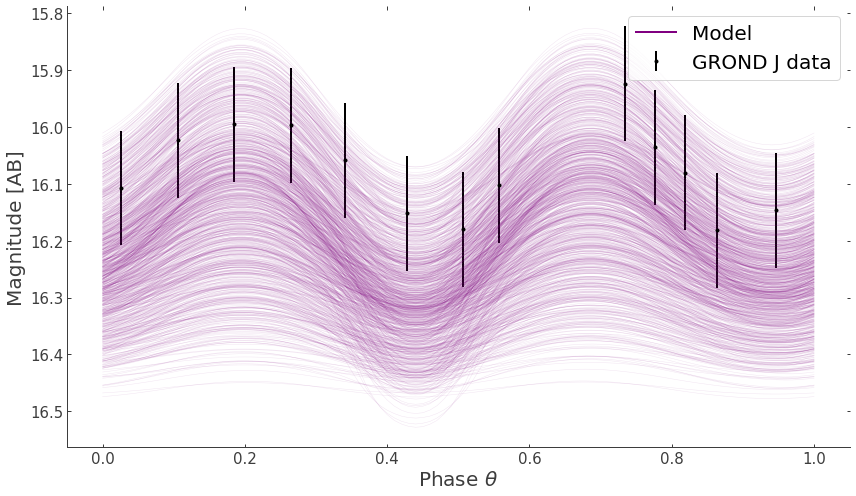

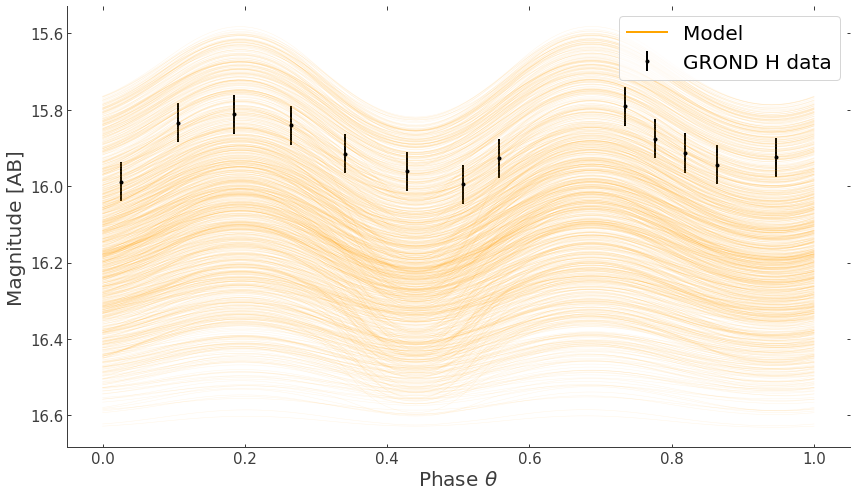

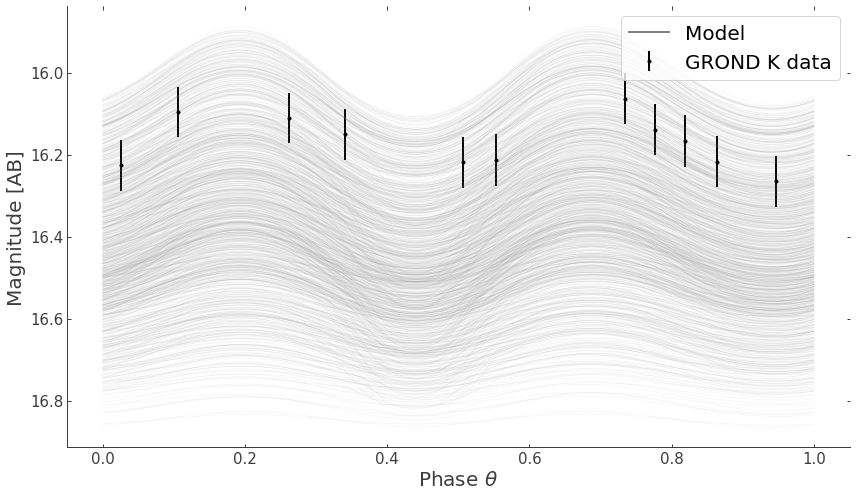

In [9]:
%%time
plotppc("Xrb_gband_source", [gdata], 0, priorparams)
plotppc("Xrb_rband_source", [rdata], 1, priorparams)
plotppc("Xrb_iband_source", [idata], 2, priorparams)
plotppc("Xrb_zband_source", [zdata], 3, priorparams)
plotppc("Xrb_Jband_source", [Jdata], 4, priorparams)
plotppc("Xrb_Hband_source", [Hdata], 5, priorparams)
plotppc("Xrb_Kband_source", [Kdata], 6, priorparams)

# Simon's stuff

took 765.434633017 seconds
took 737.304089069 seconds
took 767.074615955 seconds
took 864.369821072 seconds
took 861.403890133 seconds
took 828.599334002 seconds
took 847.700755119 seconds


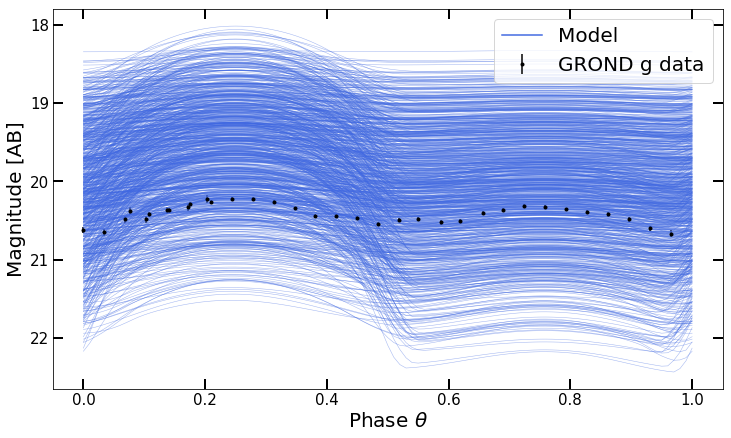

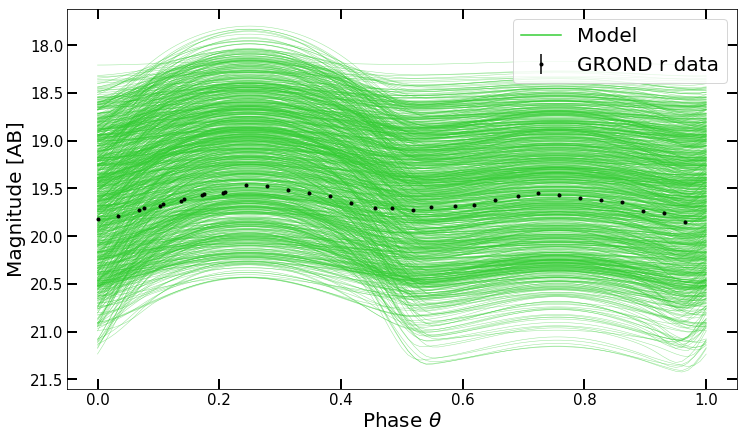

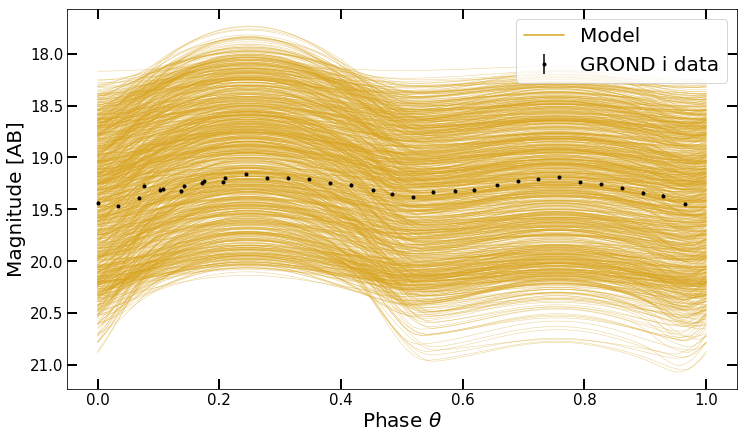

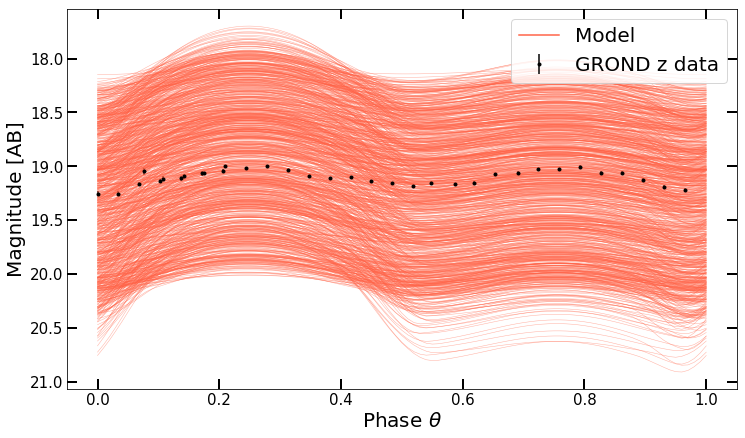

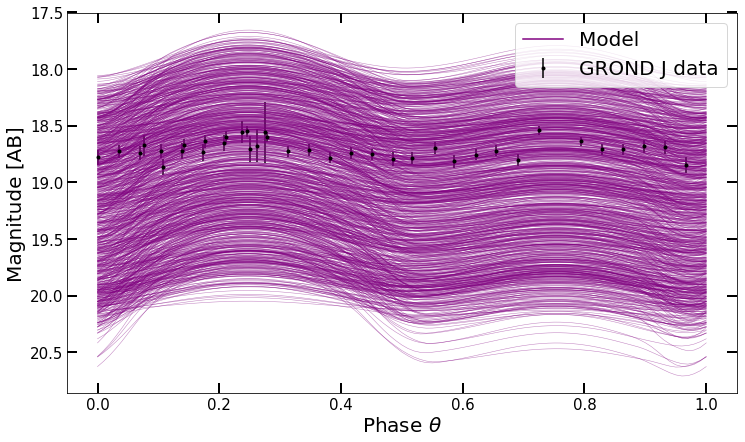

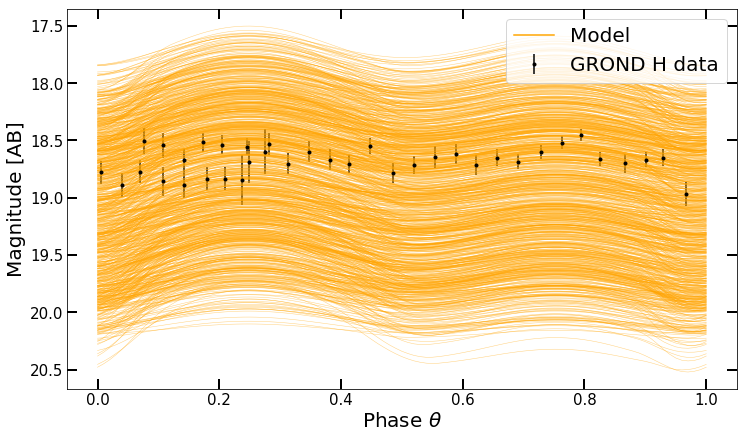

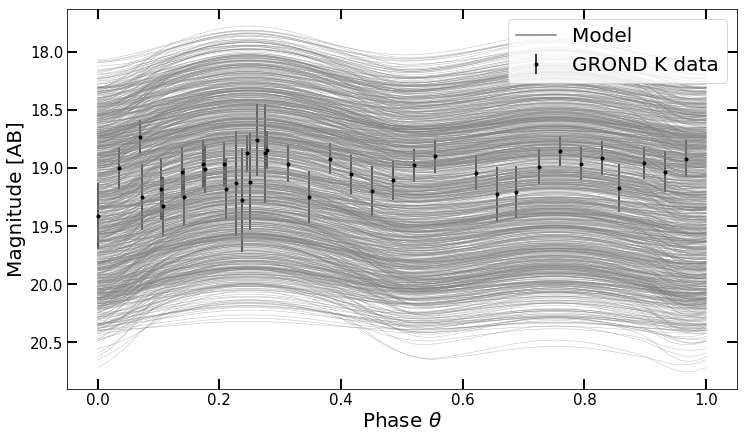

In [32]:
%%time
plotppc("Xrb_gband_source",[gdata],0)
plotppc("Xrb_rband_source",[rdata],1)
plotppc("Xrb_iband_source",[idata],2)
plotppc("Xrb_zband_source",[zdata],3)
plotppc("Xrb_Jband_source",[Jdata],4)
plotppc("Xrb_Hband_source",[Hdata],5)
plotppc("Xrb_Kband_source",[Kdata],6)

took 724.077520847 seconds


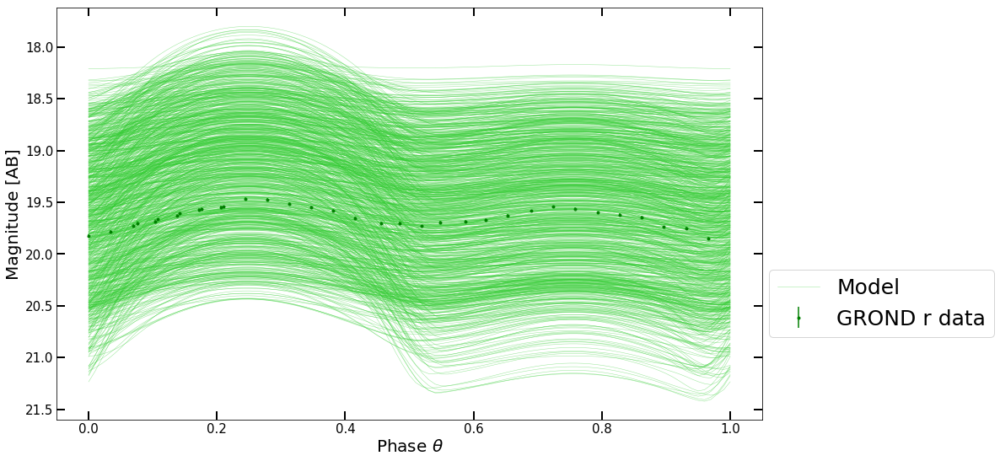

In [36]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 724.049892187 seconds


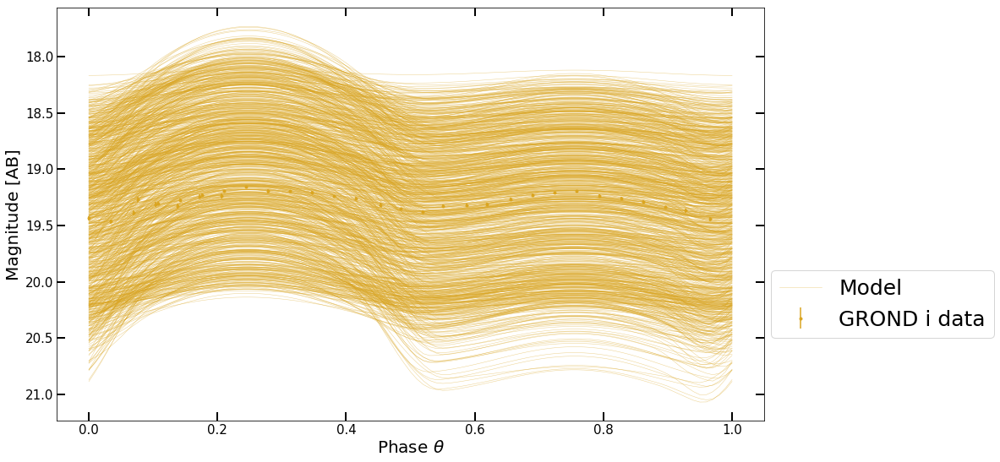

In [39]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 902.096121073 seconds


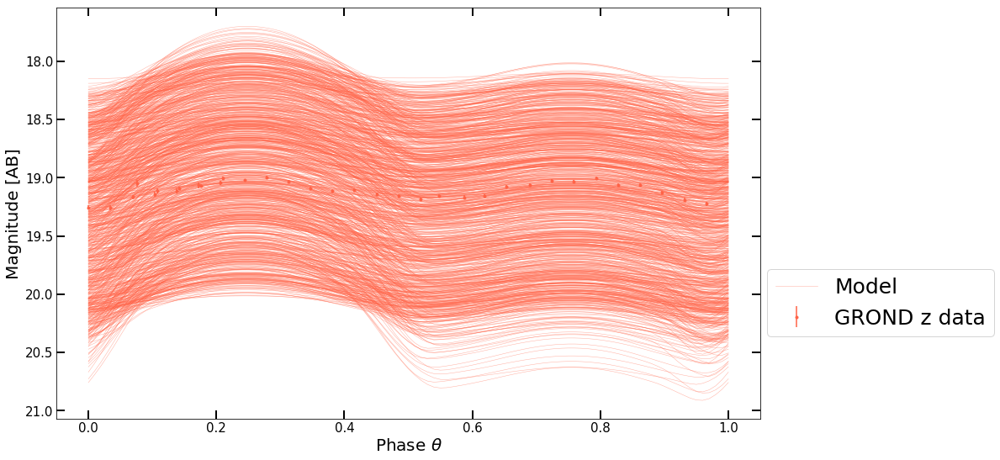

In [50]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 725.520400047 seconds


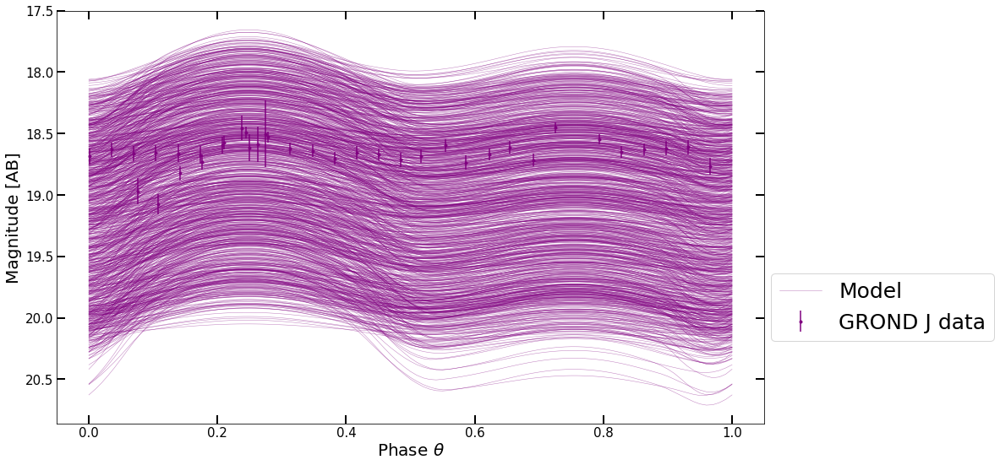

In [47]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 901.593753099 seconds


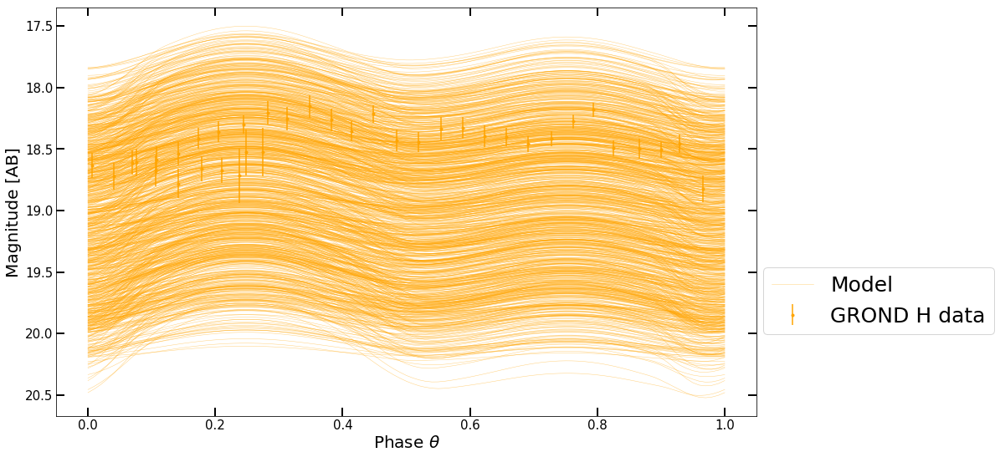

In [52]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 722.565474033 seconds


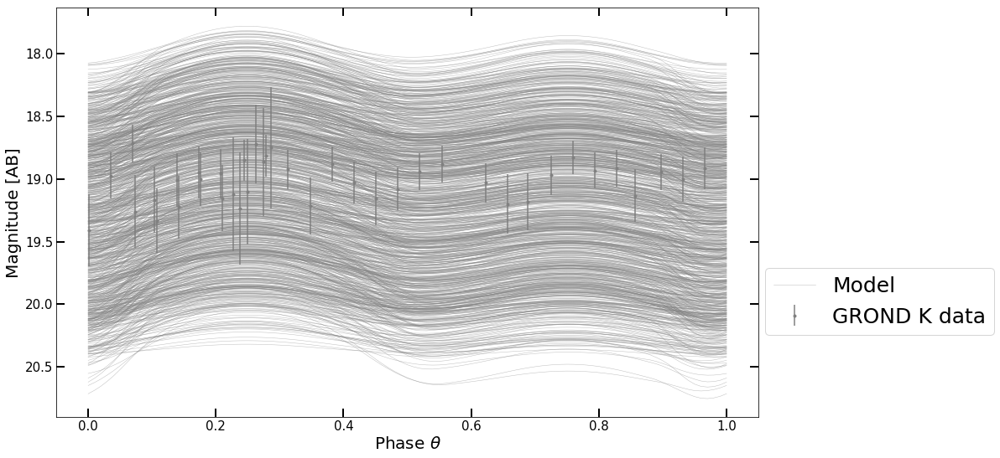

In [54]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$",fontsize =20)
handles,labels = ax.get_legend_handles_labels()
ax.legend((handles[0],handles[-1]),(labels[0],labels[-1]),fontsize =25,loc = (1.01,0.2))
ax.set_ylabel("Magnitude [AB]",fontsize =20)
ax.tick_params(axis = 'both',direction = 'in',top = True, right = True,labelsize = 15,length = 10, width = 2)
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 1419.33980417 seconds


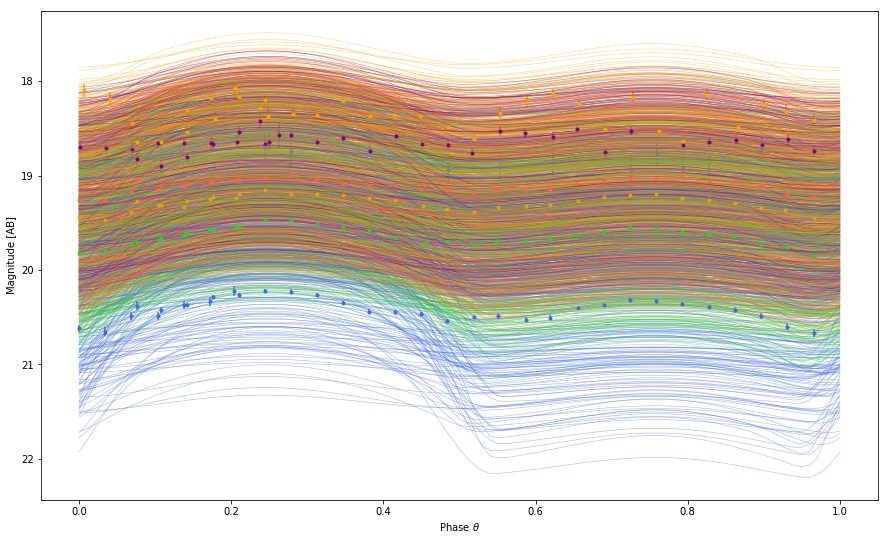

In [47]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams[:300]): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$")
#ax.legend()
ax.set_ylabel("Magnitude [AB]")
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))

took 2383.69567704 seconds


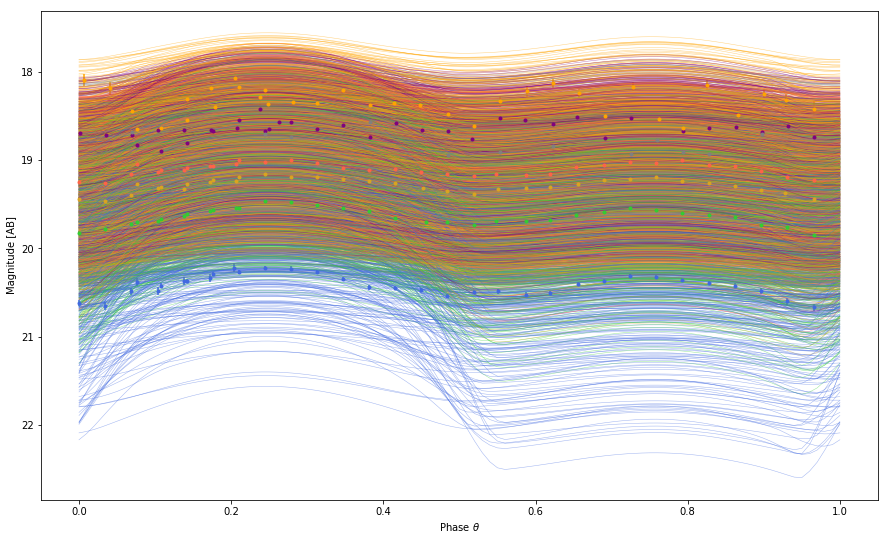

In [48]:
import time
time_start = time.time()
phases = np.arange(0,1.01,0.01)
fig, ax = plt.subplots(figsize=(15,9))
#lColor=['royalblue','limegreen','goldenrod','tomato','purple','orange','grey']
with use_astromodels_memoization(False):
    for  ev,parameterset in enumerate(priorparams[300:800]): 

            #print parameterset
        compplot2(parameterset,ax,ev)
    
    
ax.set_xlabel(r"Phase $\theta$")
#ax.legend()
ax.set_ylabel("Magnitude [AB]")
plt.gca().invert_yaxis()
time_stop = time.time()
print ('took %s seconds'%(time_stop-time_start))